# <span style='color:#0D2BA5'>Projet 6 - Classifiez automatiquement des biens de consommation : Traitement d'Images</span>

## <span style='background:#33B5FF'>Table des Matieres</span>

In [1]:
#!pip install jyquickhelper
#from jyquickhelper import add_notebook_menu
#add_notebook_menu()

## <span style='background:#33B5FF'>1. Introduction</span>

**Mission**
*****
Vous êtes Data Scientist au sein de l’entreprise "Place de marché”, qui souhaite lancer une marketplace e-commerce.
Sur cette place de marché anglophone, des vendeurs proposent des articles à des acheteurs en postant une photo et une description.
Pour l'instant, l'attribution de la catégorie d'un article est effectuée manuellement par les vendeurs, et est donc peu fiable. De plus, le volume des articles est pour l’instant très petit.
Pour rendre l’expérience utilisateur des vendeurs (faciliter la mise en ligne de nouveaux articles) et des acheteurs (faciliter la recherche de produits) la plus fluide possible, et dans l'optique d'un passage à l'échelle, il devient nécessaire d'automatiser cette tâche.
Linda, Lead Data Scientist, vous demande donc d'étudier la faisabilité d'un moteur de classification des articles en différentes catégories, à partir du texte (en anglais) et de l’image comme dans l’illustration ci-dessus, avec un niveau de précision suffisant.

**Source**
*****
Le jeux de donnée est disponible à l'adresse : [Données]()
*****



**Axes d'orientations**
*****

Nous allons :
- Réaliser, dans une première itération, une étude de faisabilité d'un moteur de classification d'articles, basé sur une image et une description, pour l'automatisation de l'attribution de la catégorie de l'article.
- Analyser les descriptions textuelles et les images des produits, au travers : 
    - Un prétraitement des données texte ou image suivant le cas ;
    - Une extraction de features ;
    - Une réduction en 2 dimensions, afin de projeter les produits sur un graphique 2D, sous la forme de points dont la couleur correspondra à la catégorie réelle ;
    - Analyse du graphique afin d’en déduire ou pas, à l’aide des descriptions ou des images, la faisabilité de regrouper automatiquement des produits de même catégorie ;
    - Réalisation d’une mesure pour confirmer ton analyse visuelle, en calculant la similarité entre les catégories réelles et les catégories issues d’une segmentation en clusters.
- Suivant cette approche, démontrer la faisabilité de regrouper automatiquement des produits de même catégorie 
- Extraire les features texte : 
     - Type “bag-of-words”, comptage simple de mots et Tf-idf ;
     - Une approche de type word/sentence embedding classique avec Word2Vec (ou Glove ou FastText) ;
     - Une approche de type word/sentence embedding avec BERT ;
     - Une approche de type word/sentence embedding avec USE (Universal Sentence Encoder). 
     
     
- Extraire les features image, il sera nécessaire de mettre en œuvre :
     - Un algorithme de type SIFT / ORB / SURF ;
     - Un algorithme de type CNN Transfer Learning.

- **Conclusions**

## <span style='background:#33B5FF'>2. Bibliothèques d'analyse Python</span>

In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

# Chargement des librairies
import datetime
import sys
from datetime import datetime
#import jyquickhelper
import numpy as np
import pandas as pd
import pickle
import os
import time
from IPython.display import display, HTML


import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
# Réduction dimension
from sklearn.manifold import TSNE
# Clustering
from sklearn.cluster import KMeans
# Traitement images
import PIL
from PIL import Image, ImageOps, ImageFilter
import cv2
from scipy.ndimage import gaussian_filter

# Warnings
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
os.chdir(r'/kaggle/working')


# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/sift-visual-words/sift_visual_words.pickle
/kaggle/input/images-place-du-marche/Images/b64149a8a9235f5199c6d8225d5dc602.jpg
/kaggle/input/images-place-du-marche/Images/8818424349b75a67775353d1feef2635.jpg
/kaggle/input/images-place-du-marche/Images/6f9c169adda9b562a841a9cf54b16f06.jpg
/kaggle/input/images-place-du-marche/Images/a4951eb41979fe482879f777c8f21d2b.jpg
/kaggle/input/images-place-du-marche/Images/13de17e59a92f8bcaec8bf103bbff8c1.jpg
/kaggle/input/images-place-du-marche/Images/a231459c1562ee1117e95a61128820b7.jpg
/kaggle/input/images-place-du-marche/Images/09f9f9b420edea2f39c0dc3c24d5be07.jpg
/kaggle/input/images-place-du-marche/Images/6e6694c52c9273cde2163d34d5b44e94.jpg
/kaggle/input/images-place-du-marche/Images/51c9062e6538c787b14a75a6a7cb7fb3.jpg
/kaggle/input/images-place-du-marche/Images/219b24362655097cb41bf06a0be8ee79.jpg
/kaggle/input/images-place-du-marche/Images/b454f9f449c9dff58b90113ba984ea98.jpg
/kaggle/input/images-place-du-marche/Images/f622e6c1

In [3]:
dico_pd_option = {
    'display.max_rows': 400,
    'display.max_column': 200,
    'display.width': 300,
    'display.precision': 5,
    'display.max_colwidth': 1000,
    'mode.chained_assignment': None
}
for cle, val in dico_pd_option.items():
    pd.set_option(cle, val)

## <span style='background:#33B5FF'>3. Explorer le jeux de données</span>

### <span style=''>3.1 Chargement du jeux de données</span>

In [4]:
# Chargement du jeux de données
data_all = pd.read_csv('/kaggle/input/place-du-marche/flipkart_com-ecommerce_sample_1050.csv')

In [5]:
# Taille : nombre de lignes/colonnes
nRow, nVar = data_all.shape
print(f'Le jeu de données contient {nRow} lignes et {nVar} variables.')

Le jeu de données contient 1050 lignes et 15 variables.


In [6]:
# Les 3 premieres lignes
data_all.head(3)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-multicolor-abstract-eyelet-door-curtain/p/itmeg7bkzdgthcts?pid=CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that ...",No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Elegance""}, {""key""=>""Designed For"", ""value""=>""Door""}, {""key""=>""Type"", ""value""=>""Eyelet""}, {""key""=>""Model Name"", ""value""=>""Abstract Polyester Door Curtain Set Of 2""}, {""key""=>""Model ID"", ""value""=>""Duster25""}, {""key""=>""Color"", ""value""=>""Multicolor""}, {""key""=>""Length"", ""value""=>""213 cm""}, {""key""=>""Number of Contents in Sales Package"", ""value""=>""Pack of 2""}, {""key""=>""Sales Package"", ""value""=>""2 Curtains""}, {""key""=>""Material"", ""value""=>""Polyester""}]}"
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-towel/p/itmegfzhxbyucwgn?pid=BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Color Red, Yellow, Blue Size Mediam Dimensions Length 30 inch Width 60 inch In the Box Number of Contents in Sales Package 3 Sales Package 3 Bath Towel",No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Washable"", ""value""=>""Yes""}, {""key""=>""Material"", ""value""=>""Cotton""}, {""key""=>""Design"", ""value""=>""Self Design""}, {""key""=>""Brand"", ""value""=>""Sathiyas""}, {""key""=>""Type"", ""value""=>""Bath Towel""}, {""key""=>""GSM"", ""value""=>""500""}, {""key""=>""Model Name"", ""value""=>""Sathiyas cotton bath towel""}, {""key""=>""Ideal For"", ""value""=>""Men, Women, Boys, Girls""}, {""key""=>""Model ID"", ""value""=>""asvtwl322""}, {""key""=>""Color"", ""value""=>""Red, Yellow, Blue""}, {""key""=>""Size"", ""value""=>""Mediam""}, {""key""=>""Length"", ""value""=>""30 inch""}, {""key""=>""Width"", ""value""=>""60 inch""}, {""key""=>""Number of Contents in Sales Package"", ""value""=>""3""}, {""key""=>""Sales Package"", ""value""=>""3 Bath Towel""}]}"
2,64

### <span style=''>3.2 Dataframe de travail </span>

- Creation du variable **image_loc** : contenant le chemin du repertoire de stochage des images ainsi que le nom du fichier image pour des appels moins verbeux dans le code 

In [7]:
# Ajout variable image_loc
# ex : data/Images/02127f52e96fb72c66bf081d25104ef8.jpg
path = '/kaggle/input/images-place-du-marche/Images/'
data_all['image_loc'] = [path + row for row in data_all['image']]

In [8]:
data_all['image_loc'].head()


0    /kaggle/input/images-place-du-marche/Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg
1    /kaggle/input/images-place-du-marche/Images/7b72c92c2f6c40268628ec5f14c6d590.jpg
2    /kaggle/input/images-place-du-marche/Images/64d5d4a258243731dc7bbb1eef49ad74.jpg
3    /kaggle/input/images-place-du-marche/Images/d4684dcdc759dd9cdf41504698d737d8.jpg
4    /kaggle/input/images-place-du-marche/Images/6325b6870c54cd47be6ebfbffa620ec7.jpg
Name: image_loc, dtype: object

**Récupération de la 1 ere sous-catégorie**

In [9]:
# Découpe les sous-catégories dans des nouvelles variables du dataframe
work = data_all['product_category_tree'].str.split(' >> ', expand=True)
data_all['Categorie_1'] = work[0]
# Nettoye les [" et "]
data_all.replace('\\["', '', regex=True, inplace=True)
data_all.replace('"\\]', '', regex=True, inplace=True)

**Dataframe de travail pour le triatement des images**

In [10]:
data = data_all.copy()
data = data[['image', 'image_loc', 'Categorie_1']]
data.head(3)

,image,image_loc,Categorie_1
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,/kaggle/input/images-place-du-marche/Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,/kaggle/input/images-place-du-marche/Images/7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,/kaggle/input/images-place-du-marche/Images/64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care


### <span style=''>3.3 Analyse des images</span>

**Nombre d'images par catégorie**

In [11]:
df_image_par_cat = data.groupby('Categorie_1').agg({'image' : 'count'})
df_image_par_cat

,image
Categorie_1,
Baby Care,150
Beauty and Personal Care,150
Computers,150
Home Decor & Festive Needs,150
Home Furnishing,150
Kitchen & Dining,150
Watches,150


**Visualisation d'un échantillon d'images**

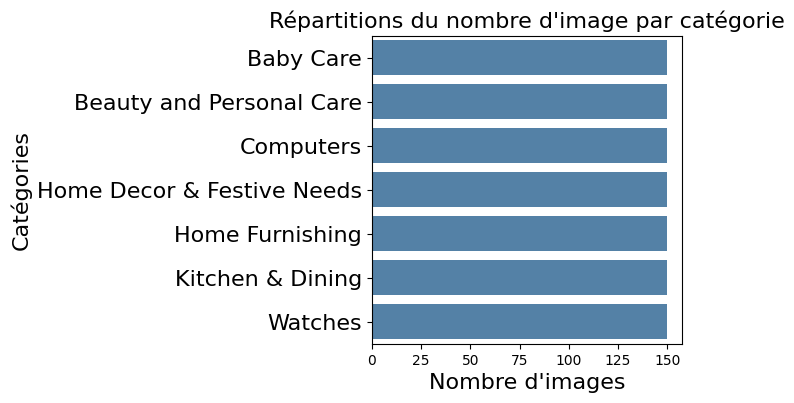

In [12]:
plt.figure(figsize=(4, 4))
sns.barplot(y=df_image_par_cat.index, x=df_image_par_cat.image,
            data=df_image_par_cat, color='SteelBlue')
plt.title('Répartitions du nombre d\'image par catégorie', fontsize=16)
plt.xlabel('Nombre d\'images', fontsize=16)
plt.ylabel('Catégories', fontsize=16)
plt.yticks(fontsize=16)
plt.grid(False)
plt.show()

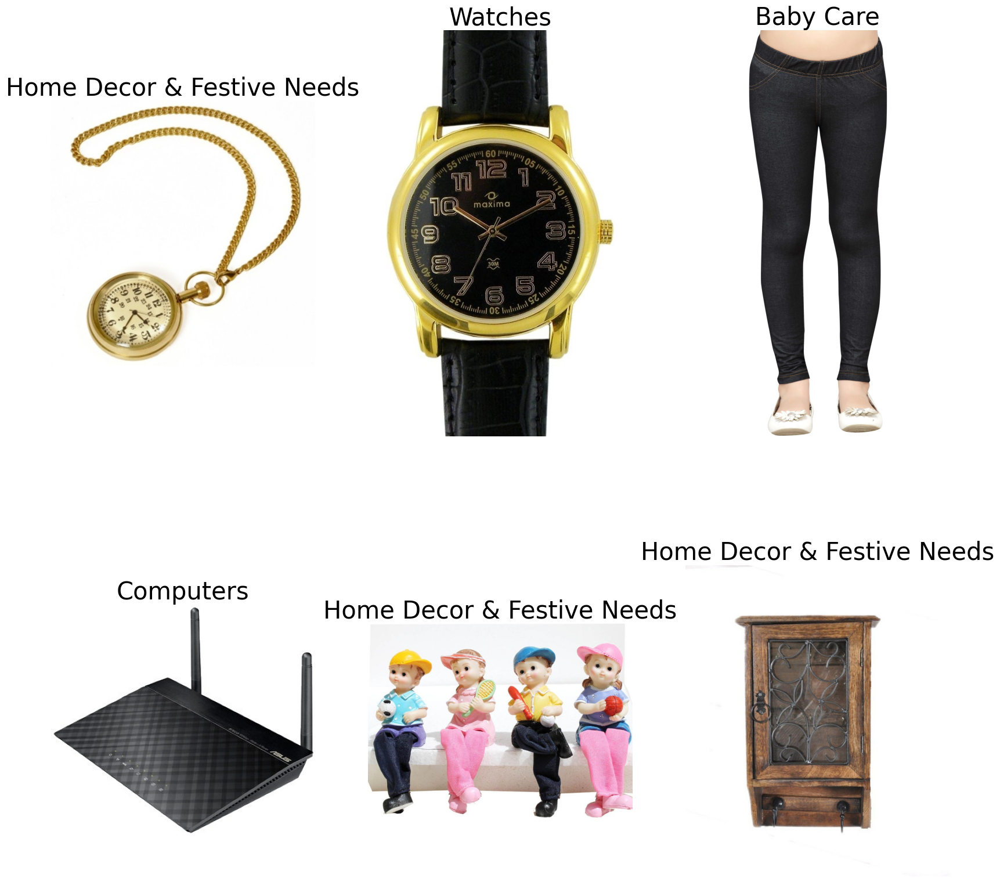

In [13]:
# Sélection de 6 images au hasard
df_visu_img = data.sample(6).reset_index()
plt.figure(figsize=(20, 20))
for i in range(6):
    plt.subplot(2, 3, i + 1)
    # Charge l'image comme matrice de pixels
    img = np.array(Image.open(df_visu_img['image_loc'][i]))
    plt.imshow(img)
    plt.title(df_visu_img['Categorie_1'][i], fontsize=30)
    plt.axis('off')

**Taille des images**

In [14]:
def distribution_variables_plages(
        dataframe, variable, liste_bins):
    """
    Retourne les plages des pourcentages des valeurs pour le découpage transmis
    Parameters
    ----------
    @param IN : dataframe : DataFrame, obligatoire
                variable : variable à découper obligatoire
                liste_bins: liste des découpages facultatif int ou pintervallindex
    @param OUT : dataframe des plages de nan
    """
    nb_lignes = len(dataframe[variable])
    s_gpe_cut = pd.cut(
        dataframe[variable],
        bins=liste_bins).value_counts().sort_index()
    df_cut = pd.DataFrame({'Plage': s_gpe_cut.index,
                           'nb_données': s_gpe_cut.values})
    df_cut['%_données'] = [
        (row * 100) / nb_lignes for row in df_cut['nb_données']]

    return df_cut


In [15]:
# Largeur des images
data['Largeur_img'] = [Image.open(row).size[0] for row in data['image_loc']]

In [16]:
# Taille des images
data['Taille_img'] = [(Image.open(row).size[0] * Image.open(row).size[1])
                      for row in data['image_loc']]


In [17]:
# Plage des largeurs des images
df_ditrib_taille = distribution_variables_plages(
    data, 'Largeur_img', [0, 500000, 1000000, 5000000, 10000000,
                         100000000])
df_ditrib_taille.style.hide()

Plage,nb_données,%_données
"(0, 500000]",1050,100.000000
"(500000, 1000000]",0,0.000000
"(1000000, 5000000]",0,0.000000
"(5000000, 10000000]",0,0.000000
"(10000000, 100000000]",0,0.000000


In [18]:
# Plage des tailles des images
df_ditrib_taille = distribution_variables_plages(
    data, 'Taille_img', [0, 500000, 1000000, 5000000, 10000000,
                         100000000])
df_ditrib_taille.style.hide()

Plage,nb_données,%_données
"(0, 500000]",165,15.714286
"(500000, 1000000]",353,33.619048
"(1000000, 5000000]",447,42.571429
"(5000000, 10000000]",52,4.952381
"(10000000, 100000000]",33,3.142857


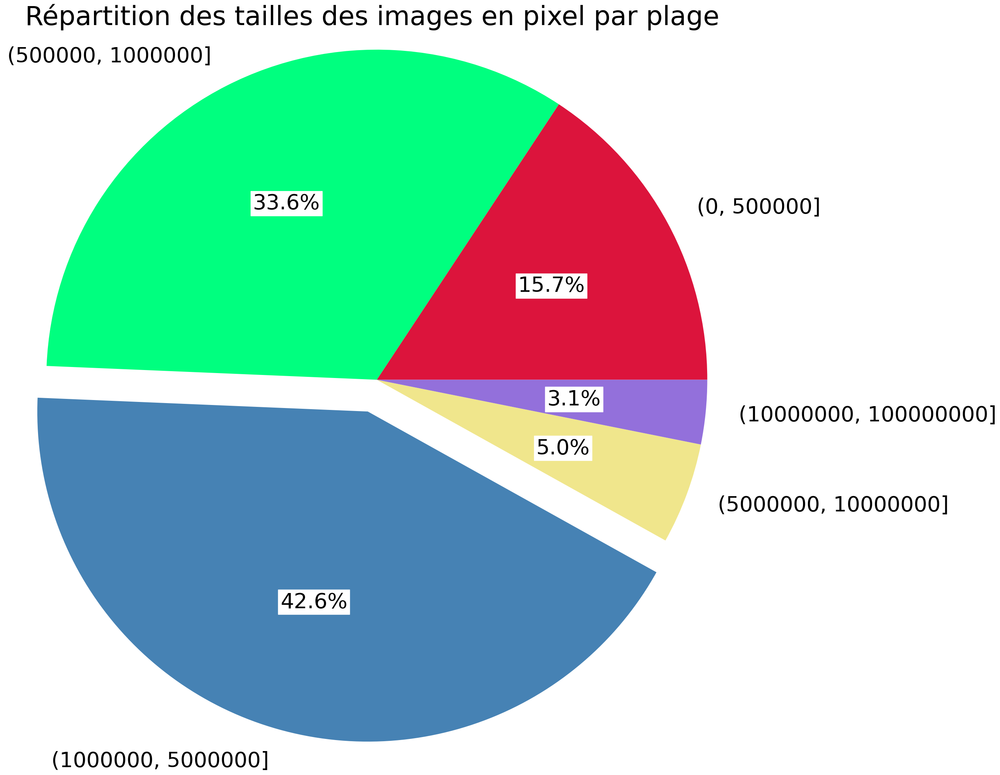

In [19]:
# Pieplot de visualisation
df_visu_taille = df_ditrib_taille[df_ditrib_taille['nb_données'] != 0]
plt.figure(figsize=(25, 25))
plt.pie(df_visu_taille['nb_données'],
        explode=(0, 0, 0.1, 0, 0),
        labels=df_visu_taille['Plage'],
        autopct='%1.1f%%',
        colors=['Crimson', 'SpringGreen', 'SteelBlue', 'Khaki',
                'MediumPurple', 'pink', 'SandyBrown', 'Aqua', 'Tomato',
                'Khaki'],
        textprops={'fontsize':40, 'color':'black',
                   'backgroundcolor':'w'})
plt.title('Répartition des tailles des images en pixel par plage',
          fontsize=50)
plt.axis('equal')
plt.show() 

- **Les images sont de tailles trés inégales, nois allons les uniformiser en les redimensionnant pour pouvoir utiliser CNN transfer learning**
- **Les tailles des images en entrées sont 224*224**


In [20]:
# Format des images
data['Format_img'] = [Image.open(row).mode for row in data['image_loc']]

In [21]:
data.groupby('Format_img').count()

,image,image_loc,Categorie_1,Largeur_img,Taille_img
Format_img,,,,,
RGB,1050,1050,1050,1050,1050


## <span style='background:#33B5FF'>4. Pré-traitement des images</span>

In [22]:
dim = (224, 224)

In [23]:
def afficher_image_histopixel(image, titre):
    '''
    Afficher côte à côte l'image et l'histogramme de répartiton des pixels.
    Parameters
    ----------
    image : image à afficher, obligatoire.
    Returns
    -------
    None.
    '''
    plt.figure(figsize=(40, 10))
    plt.subplot(131)
    plt.title(titre, fontsize=30)
    plt.imshow(image, cmap='gray')
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    plt.subplot(132)
    plt.title('Histogramme de répartition des pixels', fontsize=30)
    hist, bins = np.histogram(np.array(image).flatten(), bins=256)
    plt.bar(range(len(hist[0:255])), hist[0:255])
    plt.xlabel('Niveau de gris', fontsize=30)
    plt.ylabel('Nombre de pixels', fontsize=30)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    plt.subplot(133)
    plt.title('Histogramme cumulé des pixels', fontsize=30)
    plt.hist(np.array(image).flatten(), bins=range(256), cumulative=True)
    plt.xlabel('Niveau de gris', fontsize=24)
    plt.ylabel('Fréquence cumulée de pixels', fontsize=30)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    plt.show()


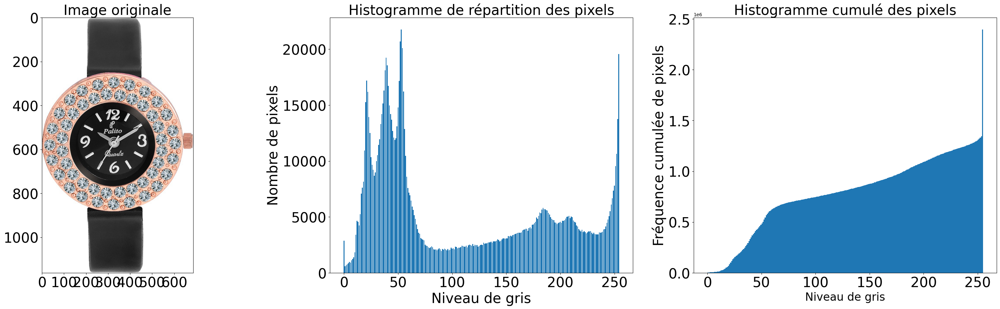

In [24]:
# Chargement de l'image originale comme matrice de pixels
img_orig = Image.open('/kaggle/input/images-place-du-marche/Images/009099b1f6e1e8f893ec29a7023153c4.jpg')
afficher_image_histopixel(img_orig, 'Image originale')

**Pré-traitement image pas a pas**

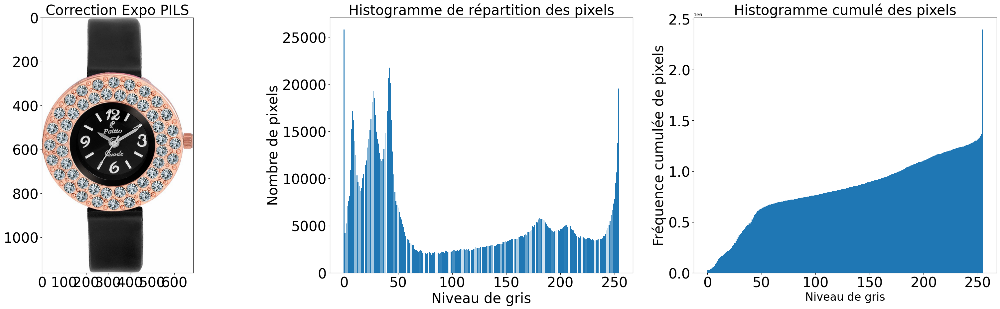

In [25]:
# Correction de l'exposition PILS
img_expo = ImageOps.autocontrast(img_orig, 1)
afficher_image_histopixel(img_expo,
                                        'Correction Expo PILS')

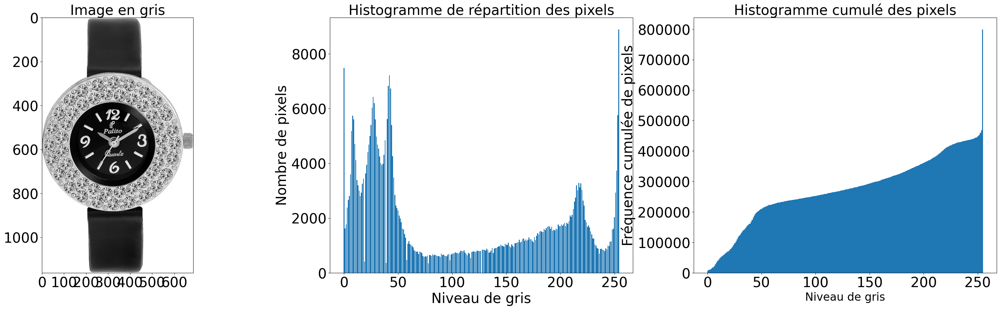

In [26]:
# Conversion de l'image en niveau de gris pour SIFT
img_gris = cv2.cvtColor(np.array(img_expo), cv2.COLOR_RGB2GRAY)
afficher_image_histopixel(img_gris,
                                        'Image en gris')

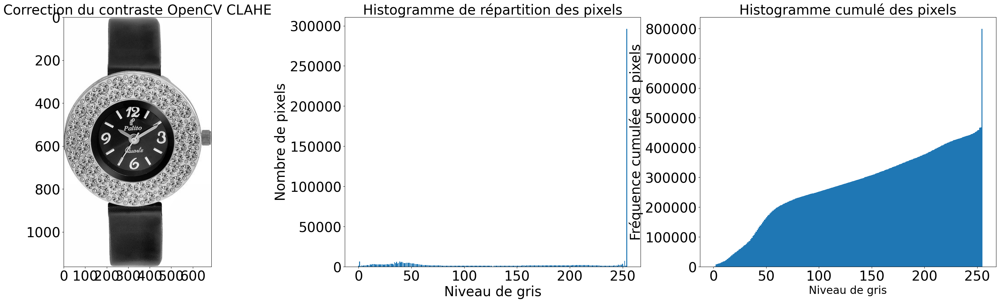

In [27]:
# Correction du contraste OpenCV méthode: CLAHE
# img_expo_gris = cv2.cvtColor(np.array(img_expo), cv2.COLOR_BGR2GRAY)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(3, 3))
img_contr_clahe = clahe.apply(img_gris)
afficher_image_histopixel(img_contr_clahe,
                                        'Correction du contraste OpenCV CLAHE')

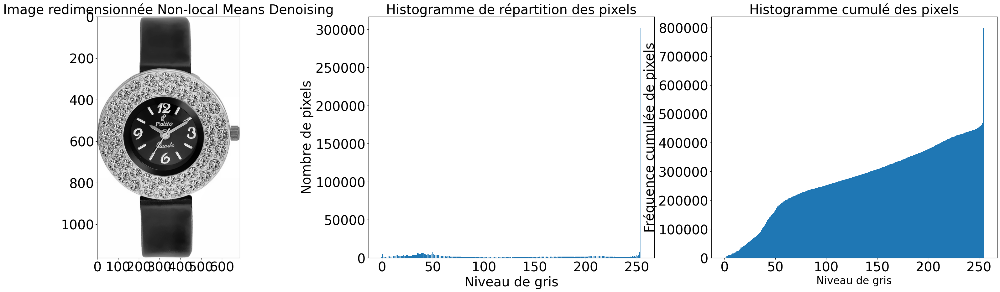

In [28]:
# Réduction du bruit avec l'algorithme Non-local Means Denoising d'OpenCV
img_fast_opencv = cv2.fastNlMeansDenoising(img_contr_clahe, None, 5, 7, 21)
afficher_image_histopixel(img_fast_opencv,
                              'Image redimensionnée Non-local Means Denoising')

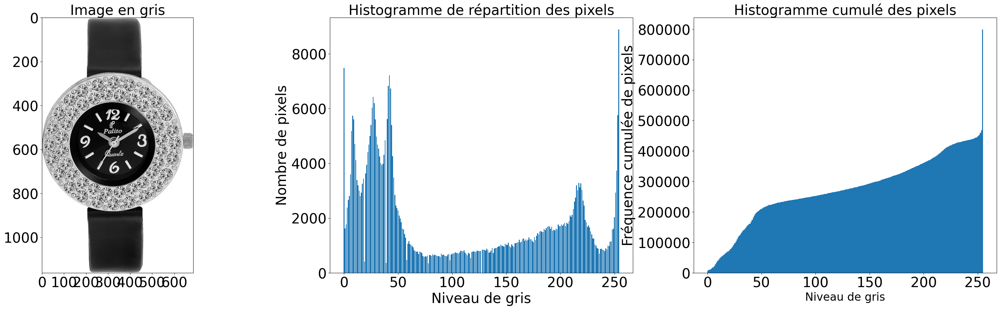

In [29]:
# Redimensionnement en 224 * 224
img = cv2.resize(np.array(img_fast_opencv), dim, interpolation=cv2.INTER_AREA)
afficher_image_histopixel(img_gris,
                                        'Image en gris')

In [30]:
def preprocess_image(image):
    '''
    Suite au pre-traitement pas a pas, le pré-traitement suivant sera appliqué sur toutes les images :
    - Correction de l'exposition (étirement d'histogramme) avec PILS
      (autocontrast).
    - Correction du contraste (égalisation d'histogramme) avec OpenCV (CLAHE
      (Contrast Limited Adaptive Histogram Equalization).
    - Réduction du bruit avec l'algorithme Non-local Means Denoising d'OpenCV.
    - Conversion en niveau de gris de l'image (ORB, SIFT...).
    - Réduction de dimension avec OpenCV (resize et interpolation INTER_AREA).
    Parameters
    ----------
    image : image localisée dans un répertoire, obligatoire.
    Returns
    -------
    None
    '''
    # Variables locales
    dim = (224, 224)

    # Nom de l'image
    file_dir = os.path.split(image)

    # Chargement de l'image originale
    img = Image.open(image)

    # Correction de l'exposition PILS (étirement de l'histogramme)
    img = ImageOps.autocontrast(img, 1)

    # Conversion en niveau de gris de l'image
    img = cv2.cvtColor(np.array(img), cv2.COLOR_BGR2GRAY)

    # Correction du contraste OpenCV CLAHE (égalisation de l'histogramme)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(3, 3))
    img = clahe.apply(img)

    # Réduction du bruit avec l'algorithme Non-local Means Denoising d'OpenCV
    img = cv2.fastNlMeansDenoising(img, None, 5, 7, 21)

    # Redimensionnement en 224 * 224
    img = cv2.resize(np.array(img), dim, interpolation=cv2.INTER_AREA)
    try:
        # Sauvegarde de l'image dans le répertoire de travail
        cv2.imwrite('/kaggle/input/image-process/Images_process/' + file_dir[1], img)
        print('kaggle/input/image-process/Images_process/' + file_dir[1])
    except IOError:
        print("Erreur d'enregistrement !")

    return 'kaggle/input/image-process/Images_process/' + file_dir[1]

In [31]:
#!pip uninstall opencv-python -y
#!pip install opencv-python=='4.8.1.78'

In [32]:
# Pré-traitement de toutes les images
#data['image_proces'] = data['image_loc'].apply(preprocess_image)
# Chargement du jeu de données
path  = "/kaggle/input/image-process/Images_process/"
# Ajout variable image_loc
# ex : data/Images/02127f52e
data['image_loc'] = [path + row for row in data_all['image']]

In [33]:
# Découpe les sous-catégories dans des nouvelles variables du dataframe
work = data_all['product_category_tree'].str.split(' >> ', expand=True)
data['Categorie_1'] = work[0]
# Nettoye les [" et "]
data_all.replace('\\["', '', regex=True, inplace=True)
data_all.replace('"\\]', '', regex=True, inplace=True)

In [34]:
data.head()

,image,image_loc,Categorie_1,Largeur_img,Taille_img,Format_img
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,/kaggle/input/image-process/Images_process/55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,3600,12960000,RGB
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,/kaggle/input/image-process/Images_process/7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,2388,3087684,RGB
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,/kaggle/input/image-process/Images_process/64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,982,715878,RGB
3,d4684dcdc759dd9cdf41504698d737d8.jpg,/kaggle/input/image-process/Images_process/d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing,1100,914100,RGB
4,6325b6870c54cd47be6ebfbffa620ec7.jpg,/kaggle/input/image-process/Images_process/6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing,2670,5574960,RGB


Il est temps de classifier ces images en utilisant différents algorithmes SIFT, ORB et SURF.
Mais comment procéder ?

- La technique de **BOVW** sacs de mots visuels permet, pour chaque image, de noter les éléments les plus importants qui se détachent de l'image. Ces éléments sont les **features ou zones d'intérêt ou points clés**.
- A chaque feature est associé un vecteur qui décrit le voisinage de la feature à laquelle il est associé, ce sont les **descripteurs**.
- Un algorithme non supervisé permet de regrouper les éléments similaires des descripteurs dans des clusters. Chaque cluster contient des bouts d'images similaires présentent dans différentes images. Elles sont donc assimilables à des mots dans un texte d'où le nom de 'mot visuel'.
- Les images contiennent des proportions différentes de ces mots visuels, ce qui permet de trouver une similitude entre les images ayant des proportions de ces mots visuels proches.


In [35]:
# Renommer image en image_proces
data = data.rename(columns = {'image': 'image_proces'})
data.head()


,image_proces,image_loc,Categorie_1,Largeur_img,Taille_img,Format_img
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,/kaggle/input/image-process/Images_process/55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,3600,12960000,RGB
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,/kaggle/input/image-process/Images_process/7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,2388,3087684,RGB
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,/kaggle/input/image-process/Images_process/64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,982,715878,RGB
3,d4684dcdc759dd9cdf41504698d737d8.jpg,/kaggle/input/image-process/Images_process/d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing,1100,914100,RGB
4,6325b6870c54cd47be6ebfbffa620ec7.jpg,/kaggle/input/image-process/Images_process/6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing,2670,5574960,RGB


## <span style='background:#33B5FF'>5. Features Extraction</span>

### <span style=''>4.1 Algorithme SIFT</span>

- SIFT (Scale Invariant Feature Transform),  cette méthode, développée en 1999 et très populaire dans le domaine de la vision par ordinateur, permet d'extraire des features (ou points d'intérêt) de l'image et de calculer leurs descripteurs. 
- L'algorithme SIFT se divise en plusieurs étapes :
    - Détection : création de l'espace des échelles, calcul des "DoG" (Différence of Gaussian), localisation des points d'intérêt.
    - Description : assignation d'orientation, création des descripteurs.   
- Les méthodes utilisées pour l'algorithme SIFT sont extraites d'OpenCV.

[Source](https://docs.opencv.org/3.4.9/d5/d3c/classcv_1_1xfeatures2d_1_1SIFT.html)

**Exemple sur une image**

**Chargement d'une image pré-traitée**

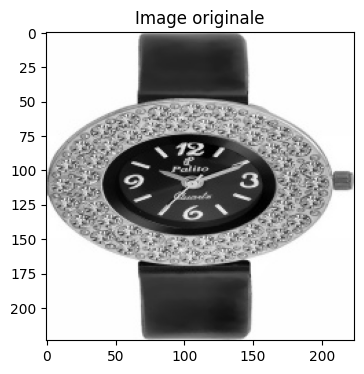

In [36]:
# Chargement de l'image précédemment traitée
montre = cv2.imread('/kaggle/input/image-process/Images_process/009099b1f6e1e8f893ec29a7023153c4.jpg')
# Visualisation de l'image
plt.figure(figsize=(4, 4))
plt.title('Image originale')
plt.imshow(montre)
plt.show()

In [37]:
# Transformation del'image en matrice de pixels pour OpenCV
montre = np.array(montre)
# Instanciation de SIFT
sift = cv2.SIFT_create()
# Extraction des points d'intérêt et des descripteurs
sift_keypoints, sift_descripteurs = sift.detectAndCompute(montre, None)
nb_feat = sift_descripteurs.shape[0]
nb_desc = sift_descripteurs.shape[1]
print(f'SIFT Montre - Nombre de features={nb_feat} pour {nb_desc} descripteurs')

SIFT Montre - Nombre de features=290 pour 128 descripteurs


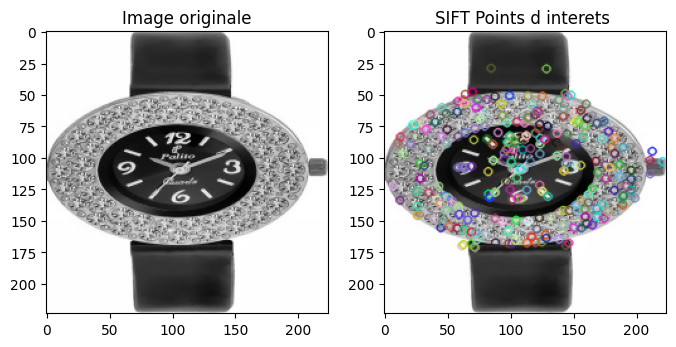

In [38]:
# Visualisation des points d'intérêt
sift_montre_keypoints = cv2.drawKeypoints(montre, sift_keypoints, None)
plt.figure(figsize=(8, 4))
# Image originale
plt.subplot(1, 2, 1)
plt.title('Image originale')
plt.imshow(montre)
# Image avec les points clés
plt.subplot(1, 2, 2)
plt.imshow(sift_montre_keypoints)
plt.title('SIFT Points d interets ')
plt.show()

**SIFT pour les 1050 images**

**Chargement des images pré-traitées**


In [39]:
def charger_image_repertoire(repertoire):
    # Chargement des images pré-traitées
    images = {}
    for filename in os.listdir(repertoire):
        path = repertoire + "/" + filename
        img = cv2.imread(path, 0)
        images[filename] = img
    return images

In [40]:
# Chargement des images pré-traitées dans le dictionnaire images
dico_images = charger_image_repertoire('/kaggle/input/image-process/Images_process')
print(f'{len(dico_images)} images chargées')

1050 images chargées


**Extraction des features Visual Words**

In [41]:
def sift_extraire_features(images):
    '''
    Extraire les descripteurs et keypoints avec SIFT.
    Parameters
    ----------
    images : les images dont on veut extraire les descripteurs et centres
             d'intérêt, obligatoire.
    Returns
    -------
    list des descripteurs et des vecteurs SIFT.
    '''
    sift_vectors = {}
    descriptor_list = []
    sift = cv2.SIFT_create()
    for key, value in images.items():
        features = []
        kp, des = sift.detectAndCompute(value, None)
        descriptor_list.extend(des)
        # in case no descriptor
        des = [np.zeros((128,))] if des is None else des
        features.append(des)
        sift_vectors[key] = features
    return [descriptor_list, sift_vectors]


In [42]:
sifts = sift_extraire_features(dico_images)

In [43]:
# Liste des descripteurs = tous les 'visual words' de toutes les images
sift_list_descripteurs = sifts[0]
len(sift_list_descripteurs)

334132

In [44]:
# Liste des vecteurs par images (dictionnaires clé=nom_image, vecteur)
sift_all_bovw_features = sifts[1]
len(sift_all_bovw_features)

1050

In [45]:
# sauvegarde des descripteurs sift
with open('/kaggle/working/sift_list_descripteurs.pickle','wb') as f:
    pickle.dump(sift_list_descripteurs,f,pickle.HIGHEST_PROTOCOL)

In [46]:
# sauvegarde des descripteurs sift
with open('/kaggle/working/sift_all_bovw_features.pickle','wb') as f:
    pickle.dump(sift_all_bovw_features,f,pickle.HIGHEST_PROTOCOL)

**Creation du dictionnaire du visual words : Bags of Words**

In [47]:
seed = 21

In [48]:
# Initialisation du dataframe de sauvegarde des métriques kmeans
df_kmeans_metrics = pd.DataFrame({})

In [49]:
from sklearn.metrics import davies_bouldin_score, silhouette_score, \
    adjusted_rand_score, homogeneity_score, completeness_score, v_measure_score

In [50]:
def calcul_metrics_kmeans(data, dataframe_metrique, type_donnees,
                          random_seed, ninit, maxiter):
    '''
    Calcul des métriques de KMeans en fonction de différents paramètres.
    Parameters
    ----------
    data : données, obligatoire.
    dataframe_metrique : dataframe de sauvegarde des résultats, obligatoire.
    type_donnees : string intitulé des données, obligatoire.
    random_seed : nombre aléatoire pour la reproductibilité, obligatoire.
    ninit : nombre de clusters à initialiser, obligatoire.
    maxiter : type d'initialisation : 'k-means++' ou 'random'.
    Returns
    -------
    dataframe_metrique : résultat des métriques
    '''
    # Cette fonction permet de calculer le nombre de clusters le plus
    # optimal pour notre analyse : le coefficient de silhouette,
    # dispersion, indice de davies_bouldin
    silhouette = []
    dispersion = []
    davies_bouldin = []
    donnees = []
    temps = []

    result_ninit = []
    result_maxiter = []

    # Hyperparametre tuning

    ninit = ninit
    maxiter = maxiter

    # Recherche des hyperparamètres
    for var_ninit in ninit:

        for var_maxiter in maxiter:

            # Top début d'exécution
            time_start = time.time()

            # Initialisation de l'algorithme
            cls = KMeans(n_clusters=7,
                         n_init=var_ninit,
                         init='k-means++',
                         max_iter=var_maxiter,
                         random_state=random_seed)

            # Entraînement de l'algorithme
            cls.fit(data)

            # Prédictions
            preds = cls.predict(data)

            # Top fin d'exécution
            time_end = time.time()

            # Calcul du score de coefficient de silhouette
            silh = silhouette_score(data, preds)
            # Calcul la dispersion
            disp = cls.inertia_
            # Calcul de l'indice davies-bouldin
            db = davies_bouldin_score(data, preds)
            # Durée d'exécution
            time_execution = time_end - time_start

            silhouette.append(silh)
            dispersion.append(disp)
            davies_bouldin.append(db)
            donnees.append(type_donnees)
            temps.append(time_execution)

            result_ninit.append(var_ninit)
            result_maxiter.append(var_maxiter)

    dataframe_metrique = dataframe_metrique._append(pd.DataFrame({
        'Type_données': donnees,
        'n_init': result_ninit,
        'max_iter': result_maxiter,
        'coef_silh': silhouette,
        'dispersion': dispersion,
        'davies_bouldin': davies_bouldin,
        'Durée (s)': temps
    }), ignore_index=True)

    return dataframe_metrique

In [51]:
# Sauvegarde des dataframes de trace
df_kmeans_metrics.to_csv('/kaggle/working/IMAGES_data_kmeans_metrics.csv')

In [52]:
# Constitution du dictionnaire de bag of words
#sift_kmeans = KMeans(n_clusters=1000, n_init=10)
#sift_kmeans.fit(sift_list_descripteurs)
#sift_visual_words = sift_kmeans.cluster_centers_

In [53]:
with open('/kaggle/input/sift-kmeans/sift_kmeans.pickle', 'rb') as km:
    sift_kmeans = pickle.load(km)

In [54]:
# sauvegarde du modele kmeans SIFT      
#with open('/kaggle/working/sift_kmeans.pickle','wb') as f:
#    pickle.dump(sift_kmeans,f,pickle.HIGHEST_PROTOCOL)

In [55]:
# sauvegarde du modele kmeans SIFT 
#with open('/kaggle/working/sift_visual_words.pickle','wb') as f:
#    pickle.dump(sift_visual_words,f,pickle.HIGHEST_PROTOCOL)

In [56]:
with open('/kaggle/input/sift-visual-words/sift_visual_words.pickle', 'rb') as vw:
    sift_visual_words = pickle.load(vw)

**Construction de l'histogramme pour chaque image**

In [57]:
from scipy.spatial import distance

In [58]:
def find_index(image, center):
    count = 0
    ind = 0
    for i in range(len(center)):
        if(i == 0):
            count = distance.euclidean(image, center[i]) 
           #count = L1_dist(image, center[i])
        else:
            dist = distance.euclidean(image, center[i]) 
            #dist = L1_dist(image, center[i])
            if(dist < count):
                ind = i
                count = dist
    return ind



In [59]:
def image_class(all_bovw, centers):
    dict_feature = {}
    for key,value in all_bovw.items():
        category = []
        for img in value:
            histogram = np.zeros(len(centers))
            for each_feature in img:
                ind = find_index(each_feature, centers)
                histogram[ind] += 1
            category.append(histogram)
        dict_feature[key] = category
    return dict_feature

In [60]:
#sift_bovw = image_class(sift_all_bovw_features,sift_visual_words)
# Sauvegarde des BOVW SIFT
#with open('/kaggle/working/sift_bovw.pickle', 'wb') as f:
#    pickle.dump(sift_bovw, f, pickle.HIGHEST_PROTOCOL)

In [61]:
with open('/kaggle/input/sift-bovw/sift_bovw.pickle', 'rb') as bvw:
    sift_bovw = pickle.load(bvw)

In [62]:
def constituer_dataframe_vectors(dataframe, variable):
    '''
    Transformer les np.array des histogrammes en autant de colonnes pour
    être utilisable par TSNE et le clustering.
    Parameters
    ----------
    dataframe : dataframe des histogrammes des images.
    variable : nom de la variable contenant les histogrammes à extraire.
    Returns
    -------
    dataframe_vecteurs : le dataframe avec chacune des BOVW de chaque umage
    dans une colonne.
    '''
    vectors = np.column_stack(dataframe[variable].values.tolist())
    dataframe_vecteurs = pd.DataFrame(vectors).T

    return dataframe_vecteurs

In [63]:
# Dataframe de sauvegarde des BOVW SIFT
df_sift_bovw = pd.DataFrame({'image_proces': sift_bovw.keys(),'sift_bovw': sift_bovw.values()})
# Ajout des BOVW en np.array d'une liste
df_sift_bovw['Histo'] = [row[0] for row in df_sift_bovw['sift_bovw']]
# Ajout de la catégorie
df_sift_bovw = df_sift_bovw.merge(data[['image_proces', 'image_loc',
                                        'Categorie_1']], how='left', on='image_proces')
# Constituer le dataframe de vecteurs de BOVW
df_sift_vectors = constituer_dataframe_vectors(df_sift_bovw, 'Histo')

In [64]:
# Sauvegarde du dataframe des vectors BOVW SIFT
with open('/kaggle/working/df_sift_vectors.pickle', 'wb') as f:
    pickle.dump(df_sift_vectors, f, pickle.HIGHEST_PROTOCOL)

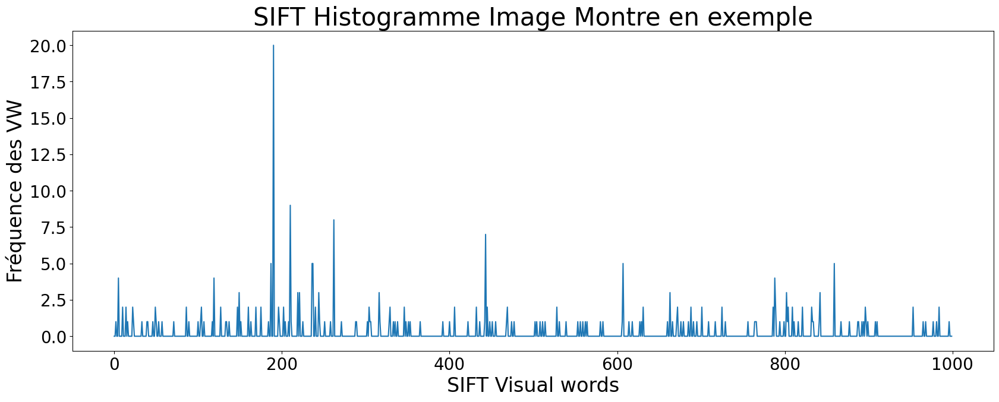

In [65]:
# Visualisation de l'histogramme pour notre image exemple
# Récupération de l'historgramme
df_visu = df_sift_bovw[df_sift_bovw['image_proces'] ==
                       '009099b1f6e1e8f893ec29a7023153c4.jpg']['sift_bovw']
histo_mug = df_visu.to_list()[0][0]
plt.figure(figsize=(20, 7))
plt.title('SIFT Histogramme Image Montre en exemple', fontsize=30)
plt.xlabel("SIFT Visual words", fontsize=24)
plt.ylabel("Fréquence des VW", fontsize=24)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.grid(False)
plt.plot(histo_mug)
plt.show()

**Réduction de dimension**

In [66]:
def affiche_tsne(results_list, liste_param, alpha=0.1):
    '''
    Affiche les résultats de la transformation Lt-SNE
    Parameters
    ----------
    results_list : iste des résultats de la transformation t-SNE, obligatoire.
    liste_param : liste des valeurs de l'hyper paramètre perplexity testées,
                  obligatoire.
    Returns
    -------
    None.
    '''
    i = 0

    # Visualisation en 2D des différents résultats selon la perplexité
    plt.subplots(3, 2, figsize=[15, 20])

    for resultat_tsne in results_list:

        # Perplexité=5
        plt.subplot(3, 2, i + 1)
        tsne_results_i = results_list[i]
        sns.scatterplot(x=tsne_results_i[:, 0], y=tsne_results_i[:, 1],
                        alpha=alpha)
        plt.title('t-SNE avec perplexité=' + str(liste_param[i]))
        plt.grid(False)
        plt.plot()

        i += 1

    plt.show()

In [67]:
type_donnee = 'TSNE_SIFT'

In [68]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA
top_depart = time.time()
liste_param = [20, 30, 40, 50, 70, 80]
results_sift = list()
tsne_results_sift = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_sift = \
        tsne.fit_transform(df_sift_vectors)
    results_sift.append(tsne_results_sift)
print('t-SNE terminée! en : {} seconds'.format(time.time()-top_depart))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.002s...
[t-SNE] Computed neighbors for 1050 samples in 0.093s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 3.823638
[t-SNE] KL divergence after 250 iterations with early exaggeration: 97.872070
[t-SNE] KL divergence after 500 iterations: 2.455311
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.002s...
[t-SNE] Computed neighbors for 1050 samples in 0.046s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 4.200238
[t-SNE] KL divergence after 250 iterations with early exaggeration: 89.673973
[t-SNE] KL divergence after 500 iterations: 2.270552
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.002s...
[t-SNE] Computed neighbors for 1050 samples in 0.

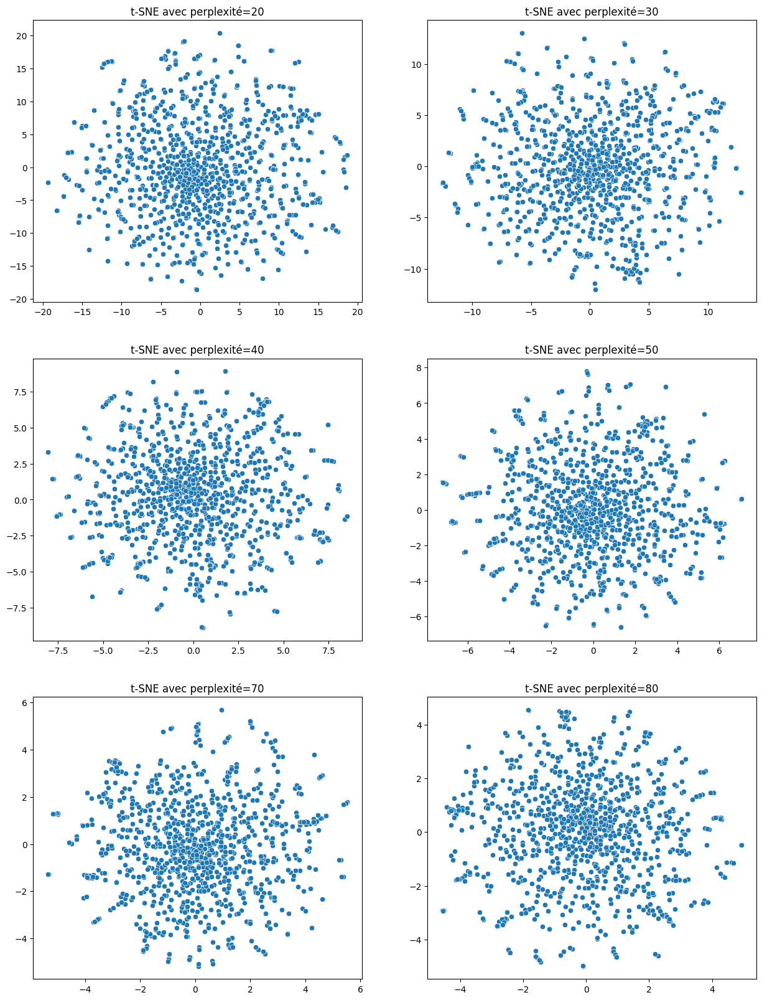

In [69]:
# Visualisation en 2D des différents résultats selon la perplexité
affiche_tsne(results_sift, liste_param, 1)

In [70]:
# Réduction de dimension tsne
tsne_sift = TSNE(verbose=1, perplexity=80, n_iter=1000)
X_proj_tsne_sift = \
    tsne_sift.fit_transform(df_sift_vectors)
# Dataframe pour clustering
df_tsne_sift = pd.DataFrame({'VAR1' : X_proj_tsne_sift[:, 0],
                             'VAR2' : X_proj_tsne_sift[:, 1],
                             'CATEGORIE' : df_sift_bovw['Categorie_1'],
                             'IMAGE': df_sift_bovw['image_proces'],
                             'IMAGE_LOC': df_sift_bovw['image_loc']})

[t-SNE] Computing 241 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.002s...
[t-SNE] Computed neighbors for 1050 samples in 0.075s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 5.450300
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.176170
[t-SNE] KL divergence after 1000 iterations: 1.528718


**Clustering**

In [71]:
cols = ['VAR1', 'VAR2']

In [72]:
# Initialisation du dataframe de sauvegarde des scores
df_scores = pd.DataFrame({})

In [73]:
# Initialisation du dataframe de sauvegarde des précisions
df_precision = pd.DataFrame({})

In [74]:
# Initialisation du dataframe de sauvegarde des métriques de clustering
df_metrics_clust = pd.DataFrame({})

In [75]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_clust = calcul_metrics_kmeans(df_tsne_sift[cols],
                                     df_metrics_clust,
                                     type_donnee,
                                     21, n_init, max_iter)
# Tri par indice de dispersion : proche de 0
df_metrics_clust[df_metrics_clust['Type_données'] == type_donnee] \
    .sort_values(by=['coef_silh', 'davies_bouldin', 'Durée (s)'],
                 ascending=[False, True, True]).style.hide()

Type_données,n_init,max_iter,coef_silh,dispersion,davies_bouldin,Durée (s)
TSNE_SIFT,10,100,0.379749,1496.752686,0.814410,0.095499
TSNE_SIFT,10,500,0.379749,1496.752563,0.814410,0.133231
TSNE_SIFT,10,200,0.379749,1496.752563,0.814410,0.133430
TSNE_SIFT,10,300,0.379749,1496.752563,0.814410,0.144175
TSNE_SIFT,20,500,0.379749,1496.752563,0.814410,0.157399
TSNE_SIFT,10,400,0.379749,1496.752563,0.814410,0.158456
TSNE_SIFT,20,300,0.379749,1496.752563,0.814410,0.166558
TSNE_SIFT,20,400,0.379749,1496.752563,0.814410,0.171101
TSNE_SIFT,20,100,0.379749,1496.752563,0.814410,0.173022
TSNE_SIFT,20,200,0.379749,1496.752563,0.814410,0.176311


In [76]:
# Instanciation du modèle KMeans avec les meilleurs paramètres
kmeans_tsne_sift = KMeans(n_clusters=7, init='k-means++',
                          n_init=70, max_iter=400,
                          random_state=seed) \
    .fit(df_tsne_sift[cols])
# Ajout de l'assignation du cluster au dataframe
df_tsne_sift['Clusters'] = kmeans_tsne_sift.labels_
kmeans_tsne_sift_labels = kmeans_tsne_sift.labels_

In [77]:
def calcul_metriques_clusters(dataframe, dataframe_sauv_res, type_donnee):
    '''
    Calcul de la métrique ARI, .
    Parameters
    ----------
    dataframe : dataframe, obligatoire.
    dataframe_sauv_res : dataframe de sauvegarde du résultat, obligatoire.
    type_donnee : titre pour dataframe de sauvegarde, obligatoire.
    Returns
    -------
    dataframe_sauv_res.
    '''
    valeur_reel = dataframe['CATEGORIE']
    valeur_pred = dataframe['Clusters']
    score_ari = adjusted_rand_score(valeur_reel, valeur_pred)
    score_homogeneite = homogeneity_score(valeur_reel, valeur_pred)
    score_completude = completeness_score(valeur_reel, valeur_pred)
    score_vmeasure = v_measure_score(valeur_reel, valeur_pred)

    dataframe_sauv_res = dataframe_sauv_res._append(pd.DataFrame({
        'Type_données': [type_donnee],
        'ARI': [score_ari],
        'Homogénéité': [score_homogeneite],
        'Complétude': [score_completude],
        'V-measure': [score_vmeasure]}), ignore_index=True)

    return dataframe_sauv_res

In [78]:
# Scores ?
df_scores = calcul_metriques_clusters(df_tsne_sift,
                                                 df_scores,
                                                 type_donnee)
df_scores[df_scores['Type_données'] == type_donnee].style.hide()

Type_données,ARI,Homogénéité,Complétude,V-measure
TSNE_SIFT,0.032199,0.060745,0.064611,0.062619


In [79]:
def affiche_repartition_par_clusters(clusters_labels):
    '''
    Affiche la répartition par cluster
    Parameters
    ----------
    clusters_labels : la séries des labels des clusters, obligatoire.
    Returns
    -------
    None.
    '''
    ax1 = plt.gca()

    # DataFrame de travail
    series_client_cluster = pd.Series(clusters_labels).value_counts()
    nb_client = series_client_cluster.sum()
    df_visu_client_cluster = pd.DataFrame(
        {'Clusters': series_client_cluster.index,
         'Nombre': series_client_cluster.values})
    df_visu_client_cluster['%'] = round(
        (df_visu_client_cluster['Nombre']) * 100 / nb_client, 2)
    df_visu_client_cluster = df_visu_client_cluster.sort_values(by='Clusters')
    display(df_visu_client_cluster.style.hide())

    # Barplot de la distribution
    sns.set_style('white')
    sns.barplot(x='Clusters', y='Nombre',
                data=df_visu_client_cluster, color='SteelBlue', ax=ax1)
    ax1.set_ylabel('Nombre)', fontsize=12)
    ax1.set_xlabel('Clusters', fontsize=12)
    ax1.set_title('Répartition par clusters', fontsize=14)
    plt.gcf().set_size_inches(6, 4)
    plt.grid(False)
    plt.show()


In [80]:
# Sauvegarde des dataframes de trace
df_scores.to_csv('/kaggle/working/IMAGES_data_df_scores.csv')

Clusters,Nombre,%
0,345,32.860000
1,129,12.290000
2,101,9.620000
3,138,13.140000
4,97,9.240000
5,134,12.760000
6,106,10.100000


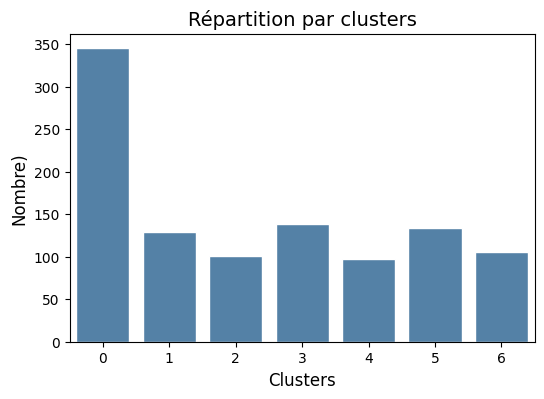

In [81]:
affiche_repartition_par_clusters(kmeans_tsne_sift_labels)

In [82]:
# Les catégories par clusters
df_tsne_sift.groupby('Clusters')['CATEGORIE'].value_counts(). \
    to_frame()

count
Clusters CATEGORIE                        
0        Kitchen & Dining               72
         Computers                      70
         Watches                        62
         Beauty and Personal Care       43
         Home Decor & Festive Needs     43
         Baby Care                      30
         Home Furnishing                25
1        Baby Care                      31
         Home Furnishing                21
         Home Decor & Festive Needs     19
         Beauty and Personal Care       17
         Computers                      17
         Kitchen & Dining               15
         Watches                         9
2        Home Furnishing                26
         Watches                        25
         Computers                      19
         Baby Care                      11
         Beauty and Personal Care        9
         Home Decor & Festive Needs      8
         Kitchen & Dining                3
3        Home Decor & Festive Needs     43
         Home Furnishing                30
         Kitchen & Dining               27
         Baby Care                      22
         Beauty and Personal Care        7
         Computers                       5
         Watches                         4
4        Beauty and Personal Care       25
         Home Furnishing                20
         Computers                      16
         Baby Care                      14
         Watches                        11
         Kitchen & Dining                9
         Home Decor & Festive Needs      2
5        Beauty and Personal Care       39
         Watches                        26
         Home Decor & Festive Needs     18
         Computers                      16
         Home Furnishing                14
         Kitchen & Dining               11
         Baby Care                      10
6        Baby Care                      32
         Home Decor & Festive Needs     17
         Home Furnishing                14
         Kitchen & Dining               13
         Watches                        13
         Beauty and Personal Care       10
         Computers                       7

**Visualisation des clusters**

In [83]:
def affiche_projection_par_clusters(X_projected, clusters_labels, titre):
    '''
    Affiche la projection scatterplot par clusters.
    Parameters
    ----------
    proj_tsne : projection, obligatoire.
    clusters_labels : la variable représentant les clusters.
    Returns
    -------
    None.
    '''
    plt.figure(figsize=[25, 15])

    sns.scatterplot(x = X_projected[:, 0], y =  X_projected[:, 1],
                    hue=clusters_labels, s=100, alpha=1, palette='Set1')

    plt.title(titre, fontsize=40)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=34)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    plt.grid(False)
    plt.show()

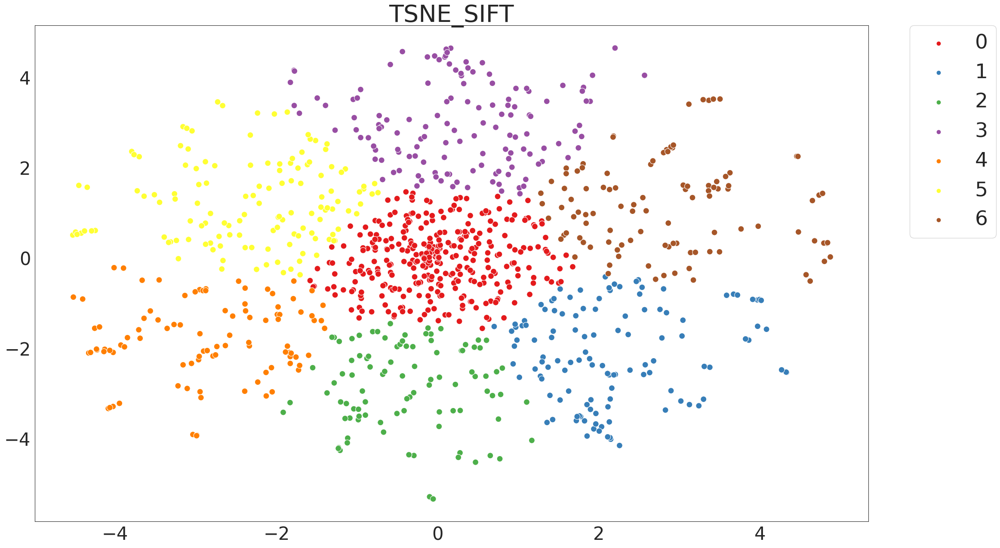

In [84]:
# Visualisation des clusters
affiche_projection_par_clusters(X_proj_tsne_sift,
                                           kmeans_tsne_sift_labels,
                                           type_donnee)

**Qualité de la catégorisation**

In [85]:
from sklearn.metrics import confusion_matrix, classification_report, \
    accuracy_score
from IPython.display import display, Markdown

In [86]:
def traduire_valeurs_variable(dataframe, colonne_a_traduire, dictionnaire):
    """
    Traduire les valeurs de la colonne du dataframe transmis par la valeur du dictionnaire
    ----------
    @param IN : dataframe : DataFrame, obligatoire
                colonne_a_traduire : colonne dont on veut traduire les valeurs obligatoire
                dictionnaire :dictionnaire clé=à remplacer,
                              valeur = le texte de remplacement oblgatoire
    @param OUT :None
    """
    for cle, valeur in dictionnaire.items():
        dataframe[colonne_a_traduire] = dataframe[colonne_a_traduire].replace(
            cle, valeur)

In [87]:
def affiche_qualite_categorisation(dataframe, dico_traduction, titre):
    '''
    Afiche heatmap de la qualité de la catégorisation et donne l'accuracy.
    Parameters
    ----------
    dataframe : dataframe, obligatoire.
    dico_traduction : traduction des catégories de nombre à texte, obligatoire.
    titre : type de données traitées.
    Returns
    -------
    None.
    '''
    dataframe['Cluster_labels'] = dataframe['Clusters'].copy().astype('str')
    traduire_valeurs_variable(dataframe, 'Cluster_labels',
                                          dico_traduction)

    cat_pred = dataframe['CATEGORIE']
    cat_reel = dataframe['Cluster_labels']

    plt.figure(figsize=(6, 4))
    sns.heatmap(confusion_matrix(cat_reel, cat_pred),
                annot=True,
                fmt='d',
                cbar=False,
                cmap='Blues',
                yticklabels=sorted(cat_pred.unique()))
    plt.title(titre)
    plt.show()

    display(
        'Précision: {}%'.format(
            round(
                accuracy_score(
                    cat_pred,
                    cat_reel) *
                100,
                2)))
    display(Markdown(classification_report(cat_reel, cat_pred)))

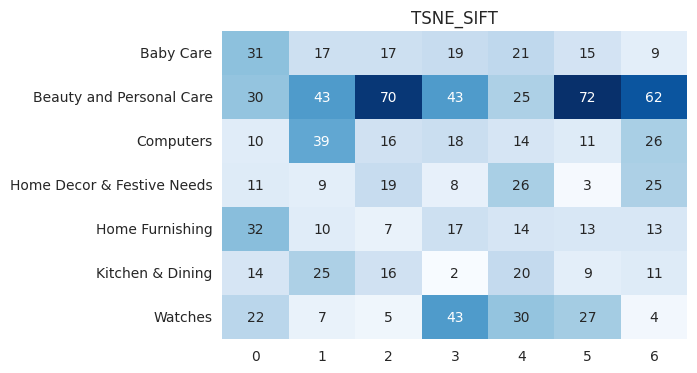

'Précision: 11.9%'

                            precision    recall  f1-score   support

                 Baby Care       0.21      0.24      0.22       129
  Beauty and Personal Care       0.29      0.12      0.17       345
                 Computers       0.11      0.12      0.11       134
Home Decor & Festive Needs       0.05      0.08      0.06       101
           Home Furnishing       0.09      0.13      0.11       106
          Kitchen & Dining       0.06      0.09      0.07        97
                   Watches       0.03      0.03      0.03       138

                  accuracy                           0.12      1050
                 macro avg       0.12      0.12      0.11      1050
              weighted avg       0.16      0.12      0.13      1050


In [88]:
dico_categories = {'0': 'Beauty and Personal Care',
                   '1': 'Baby Care',
                   '2': 'Home Decor & Festive Needs',
                   '3': 'Watches',
                   '4': 'Kitchen & Dining',
                   '5': 'Computers',
                   '6': 'Home Furnishing'}
affiche_qualite_categorisation(df_tsne_sift,
                                          dico_categories, type_donnee)

In [89]:

# Sauvegarde des dataframes de trace
df_precision.to_csv('/kaggle/working/IMAGES_data_df_precision.csv')

In [90]:
# Sauvegarde du dataframe des TSNE SIFT
with open('/kaggle/working/df_tsne_sift.pickle', 'wb') as f:
    pickle.dump(df_tsne_sift, f, pickle.HIGHEST_PROTOCOL)

In [91]:
# Nombre d'erreur
mask = df_tsne_sift['CATEGORIE'] == df_tsne_sift['Cluster_labels']
df_erreur_sift = df_tsne_sift[~mask]
display(f'Nombre d\'erreurs : {df_erreur_sift.shape[0]}')

"Nombre d'erreurs : 925"

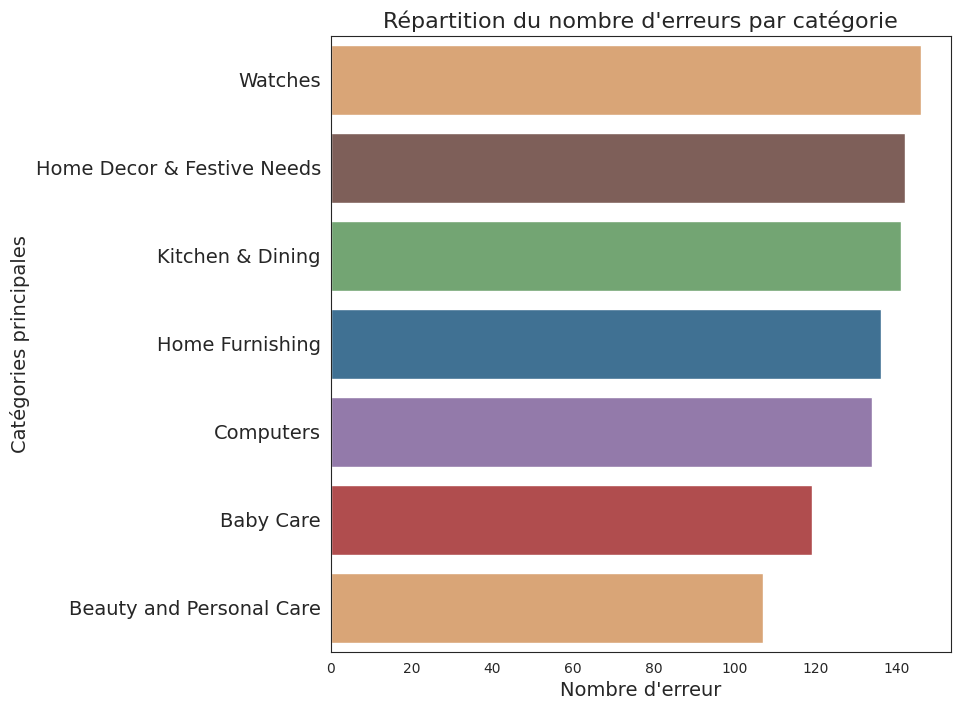

In [92]:
# Répartition des erreurs par catégorie
plt.figure(figsize=(8, 8))
sns.countplot(y='CATEGORIE', data=df_erreur_sift, orient='h',
              order=df_erreur_sift['CATEGORIE'].value_counts().index,
              palette=['#e9a467', '#845b53', '#6bad6b', '#3274a1',
                       '#9372b2', '#c03d3e'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=16)
plt.xlabel('Nombre d\'erreur', fontsize=14)
plt.ylabel('Catégories principales', fontsize=14)
plt.yticks(fontsize=14)
plt.show()

In [93]:
def path_to_image_photo_html(path):
    return '<img src="' + path + ' " width="100">'

In [94]:
df_visu_erreur = df_erreur_sift[['CATEGORIE', 'IMAGE_LOC',
                                 'Cluster_labels']].head(10)
display(HTML(df_visu_erreur.
             to_html(escape=False,
                     formatters=dict(IMAGE_LOC=path_to_image_photo_html))))

,CATEGORIE,IMAGE_LOC,Cluster_labels
0,Watches,,Home Decor & Festive Needs
1,Baby Care,,Home Furnishing
2,Watches,,Beauty and Personal Care
3,Home Decor & Festive Needs,,Watches
4,Beauty and Personal Care,,Baby Care
5,Beauty and Personal Care,,Computers
6,Home Decor & Festive Needs,,Watches
7,Home Decor & Festive Needs,,Watches
8,Watches,,Beauty and Personal Care
9,Kitchen & Dining,,Watches


In [95]:
# Sauvegarde du dataframe des erreurs SIFT
with open('/kaggle/working/df_erreur_sift.pickle', 'wb') as f:
    pickle.dump(df_erreur_sift, f, pickle.HIGHEST_PROTOCOL)


In [96]:
def affiche_qualite_classification(dataframe, titre):
    '''
    Afiche heatmap de la qualité de la catégorisation et donne l'accuracy.
    Parameters
    ----------
    dataframe : dataframe, obligatoire.
    titre : type de données traitées.
    Returns
    -------
    None.
    '''
    cat_pred = dataframe['Label']
    cat_reel = dataframe['CATEGORIE']

    plt.figure(figsize=(6, 4))
    sns.heatmap(confusion_matrix(cat_reel, cat_pred),
                annot=True,
                fmt='d',
                cbar=False,
                cmap='Blues',
                yticklabels=sorted(cat_pred.unique()))
    plt.title(titre)
    plt.show()

    display(
        'Précision: {}%'.format(
            round(
                accuracy_score(
                    cat_pred,
                    cat_reel) *
                100,
                2)))
    display(Markdown(classification_report(cat_reel, cat_pred)))


### <span style=''>4.3 Algorithme VGG16</span>

- VGG-16 est une version du réseau de neurones convolutif VGG-Net.
- VGG-16 est constitué de plusieurs couches, dont 13 couches de convolution et 3 fully-connected. Il doit donc apprendre les poids de 16 couches.
- Il prend en entrée une image en couleurs de taille 224 × 224 px et la classifie dans une des 1000 classes. Il renvoie donc un vecteur de taille 1000, qui contient les probabilités d'appartenance à chacune des classes.

**Chargement des images, extraction des features**

In [97]:
# Utilisation de VGG16 pré-entraîné sur ImageNet avec les images d'origine
# VGG16 imports
import keras
from keras.preprocessing import image
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input

# Liste
vgg16_all_features = []

# Instanciation du modèle
model_vgg16 = VGG16(weights='/kaggle/input/imagenet/vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5', include_top=False)
# Résumé de l'architecture du modèle
model_vgg16.summary()

for rep_image in data['image_loc']:

    # Charger l'image et la redimensionner à la taille
    # requise de 224×224 pixels.
    img = image.load_img(rep_image, target_size=(224, 224))
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler
    # avec dans Keras
    img = image.img_to_array(img)
    # Redimensionnement
    img = np.expand_dims(img, axis=0)
    # Préparer de nouvelles entrées pour le réseau.
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance
    # de l'image à chacun des 1000 types d'objets connus.
    vgg16_feature = model_vgg16.predict(img)
    # Ajouter la feature prédite en nparray à la liste
    vgg16_all_features.append(np.array(vgg16_feature).flatten())

vgg16_all_features = np.array(vgg16_all_features)

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

In [98]:
# Dataframe de sauvegarde des BOVW VGG16
# Association des features à chaque image
data['vgg16_bovw'] = [vgg16_all_features[i] for i in range(data.shape[0])]
# Dataframe de travail
df_vgg16_bovw = data[['image_proces', 'image_loc', 'Categorie_1', 'vgg16_bovw']]
# Constituer le dataframe de vecteurs de BOVW VGG16
df_vgg16_vectors = pd.DataFrame.from_records(vgg16_all_features)

In [99]:
# Sauvegarde du dataframe des vectors BOVW VGG16
with open('/kaggle/working/df_vgg16_vectors.pickle', 'wb') as f:
    pickle.dump(df_vgg16_vectors, f, pickle.HIGHEST_PROTOCOL)

**Reduction de dimension**

In [100]:
type_donnee = 'TSNE_VGG16'
seed = 21

In [101]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA
top_depart = time.time()
liste_param = [20, 30, 40, 50, 70, 80]
results_vgg16 = list()
tsne_results_vgg16 = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_vgg16 = \
        tsne.fit_transform(df_vgg16_vectors)
    results_vgg16.append(tsne_results_vgg16)
print('t-SNE terminée! en : {} seconds'.format(time.time()-top_depart))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.083s...
[t-SNE] Computed neighbors for 1050 samples in 1.153s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 411.327058
[t-SNE] KL divergence after 250 iterations with early exaggeration: 93.985168
[t-SNE] KL divergence after 500 iterations: 1.861735
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.083s...
[t-SNE] Computed neighbors for 1050 samples in 1.014s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 446.494912
[t-SNE] KL divergence after 250 iterations with early exaggeration: 87.865059
[t-SNE] KL divergence after 500 iterations: 1.706515
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.082s...
[t-SNE] Computed neighbors for 1050 samples i

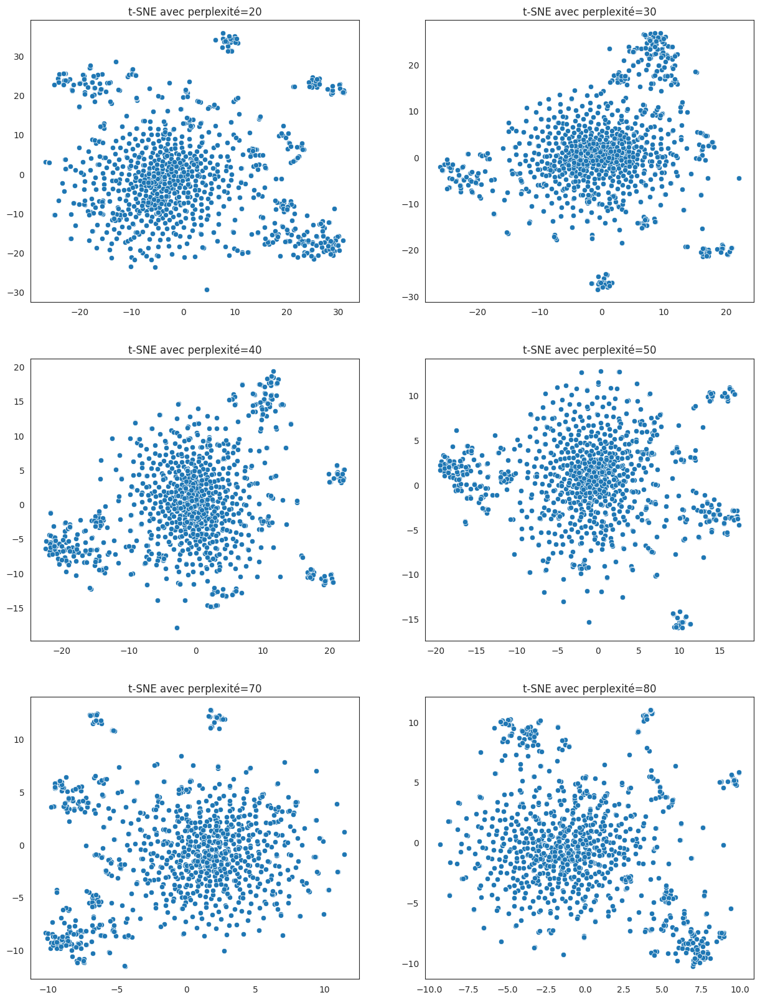

In [102]:
affiche_tsne(results_vgg16, liste_param, 1)

In [103]:
# Réduction de dimension tsne
tsne_vgg16 = TSNE(verbose=1, perplexity=20, n_iter=5000)
X_proj_tsne_vgg16 = \
    tsne_vgg16.fit_transform(df_vgg16_vectors)
# Dataframe pour clustering
df_tsne_vgg16 = pd.DataFrame({'VAR1' : X_proj_tsne_vgg16[:, 0],
                              'VAR2' : X_proj_tsne_vgg16[:, 1],
                              'CATEGORIE' : df_vgg16_bovw['Categorie_1'],
                              'IMAGE': df_vgg16_bovw['image_proces'],
                              'IMAGE_LOC': df_vgg16_bovw['image_loc']})

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.079s...
[t-SNE] Computed neighbors for 1050 samples in 1.214s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 411.327058
[t-SNE] KL divergence after 250 iterations with early exaggeration: 96.112221
[t-SNE] KL divergence after 5000 iterations: 1.768337


In [104]:
cols = ['VAR1', 'VAR2']

In [105]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_clust = calcul_metrics_kmeans(df_tsne_vgg16[cols],
                                     df_metrics_clust,
                                     type_donnee,
                                     seed, n_init, max_iter)
# Tri par indice de dispersion : proche de 0
df_metrics_clust[df_metrics_clust['Type_données'] == type_donnee] \
    .sort_values(by=['coef_silh', 'davies_bouldin', 'Durée (s)'],
                 ascending=[False, True, True]).style.hide()

Type_données,n_init,max_iter,coef_silh,dispersion,davies_bouldin,Durée (s)
TSNE_VGG16,10,100,0.436630,158019.156250,0.643851,0.041056
TSNE_VGG16,10,300,0.436630,158019.156250,0.643851,0.119117
TSNE_VGG16,10,400,0.436630,158019.156250,0.643851,0.123259
TSNE_VGG16,10,200,0.436630,158019.156250,0.643851,0.134690
TSNE_VGG16,10,500,0.436630,158019.156250,0.643851,0.142850
TSNE_VGG16,20,500,0.436630,158019.156250,0.643851,0.154869
TSNE_VGG16,20,100,0.436630,158019.156250,0.643851,0.159117
TSNE_VGG16,20,200,0.436630,158019.156250,0.643851,0.173989
TSNE_VGG16,20,300,0.436630,158019.156250,0.643851,0.174707
TSNE_VGG16,20,400,0.436630,158019.156250,0.643851,0.176411


In [106]:
# Instanciation du modèle KMeans avec les meilleurs paramètres
kmeans_tsne_vgg16 = KMeans(n_clusters=7, init='k-means++',
                           n_init=80, max_iter=100,
                           random_state=seed) \
    .fit(df_tsne_vgg16[cols])
# Ajout de l'assignation du cluster au dataframe
df_tsne_vgg16['Clusters'] = kmeans_tsne_vgg16.labels_
kmeans_tsne_vgg16_labels = kmeans_tsne_vgg16.labels_

In [107]:
# Scores ?
df_scores = calcul_metriques_clusters(df_tsne_vgg16,
                                                 df_scores,
                                                 type_donnee)
df_scores[df_scores['Type_données'] == type_donnee].style.hide()

Type_données,ARI,Homogénéité,Complétude,V-measure
TSNE_VGG16,0.290734,0.405207,0.448574,0.425789


In [108]:
# Sauvegarde des dataframes de trace
df_scores.to_csv('IMAGES_data_df_scores.csv')

Clusters,Nombre,%
0,143,13.620000
1,125,11.900000
2,270,25.710000
3,31,2.950000
4,43,4.100000
5,253,24.100000
6,185,17.620000


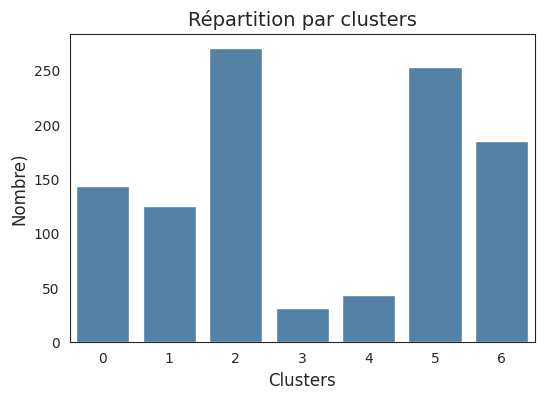

In [109]:
affiche_repartition_par_clusters(kmeans_tsne_vgg16_labels)

In [110]:
# Les catégories par clusters
df_tsne_vgg16.groupby('Clusters')['CATEGORIE'].value_counts(). \
    to_frame()


count
Clusters CATEGORIE                        
0        Watches                       139
         Home Decor & Festive Needs      3
         Computers                       1
1        Beauty and Personal Care       98
         Computers                      19
         Kitchen & Dining                5
         Home Decor & Festive Needs      2
         Baby Care                       1
2        Home Furnishing               104
         Baby Care                      81
         Home Decor & Festive Needs     34
         Computers                      32
         Beauty and Personal Care       14
         Kitchen & Dining                4
         Watches                         1
3        Kitchen & Dining               31
4        Kitchen & Dining               42
         Baby Care                       1
5        Home Decor & Festive Needs     94
         Kitchen & Dining               59
         Computers                      34
         Beauty and Personal Care       33
         Baby Care                      22
         Watches                         7
         Home Furnishing                 4
6        Computers                      64
         Baby Care                      45
         Home Furnishing                42
         Home Decor & Festive Needs     17
         Kitchen & Dining                9
         Beauty and Personal Care        5
         Watches                         3

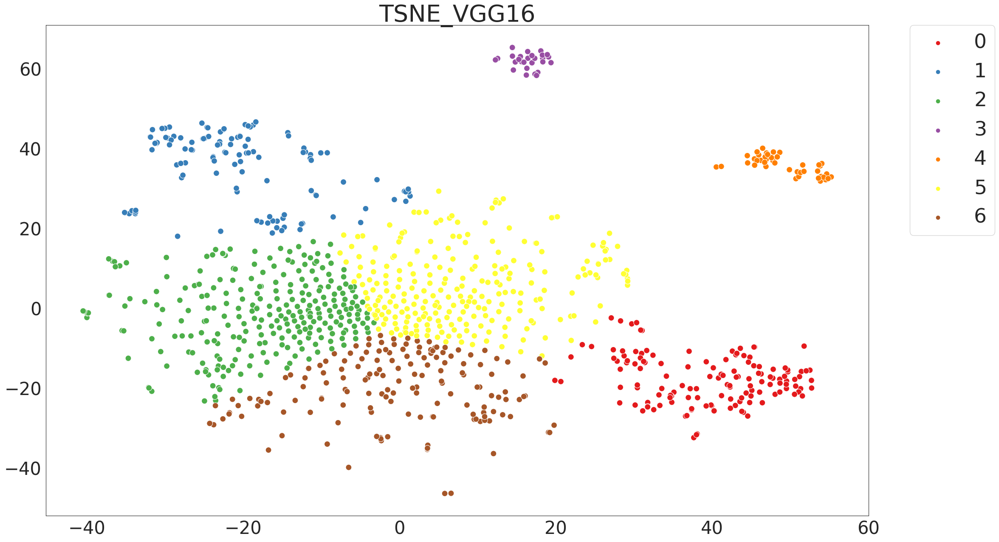

In [111]:
# Visualisation des clusters
affiche_projection_par_clusters(X_proj_tsne_vgg16,
                                           kmeans_tsne_vgg16_labels,
                                           type_donnee)

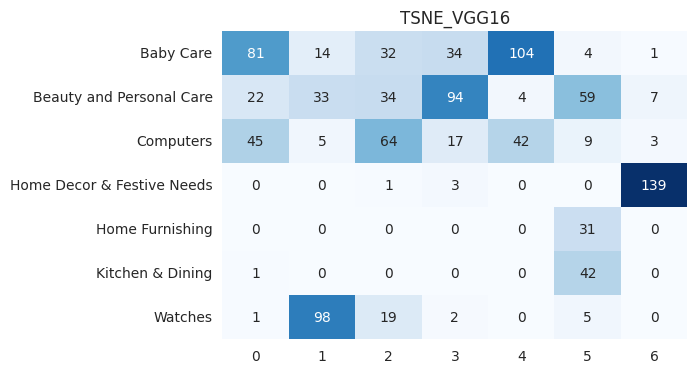

'Précision: 21.24%'

                            precision    recall  f1-score   support

                 Baby Care       0.54      0.30      0.39       270
  Beauty and Personal Care       0.22      0.13      0.16       253
                 Computers       0.43      0.35      0.38       185
Home Decor & Festive Needs       0.02      0.02      0.02       143
           Home Furnishing       0.00      0.00      0.00        31
          Kitchen & Dining       0.28      0.98      0.44        43
                   Watches       0.00      0.00      0.00       125

                  accuracy                           0.21      1050
                 macro avg       0.21      0.25      0.20      1050
              weighted avg       0.28      0.21      0.23      1050


In [112]:
dico_categories = {'0': 'Home Decor & Festive Needs',
                   '1': 'Watches',
                   '2': 'Baby Care',
                   '3': 'Home Furnishing',
                   '4': 'Kitchen & Dining',
                   '5': 'Beauty and Personal Care',
                   '6': 'Computers'}
affiche_qualite_categorisation(df_tsne_vgg16,
                                          dico_categories, type_donnee)

In [113]:
# Nombre d'erreur
mask = df_tsne_vgg16['CATEGORIE'] == df_tsne_vgg16['Cluster_labels']
df_erreur_vgg16 = df_tsne_vgg16[~mask]
display(f'Nombre d\'erreurs : {df_erreur_vgg16.shape[0]}')

"Nombre d'erreurs : 827"

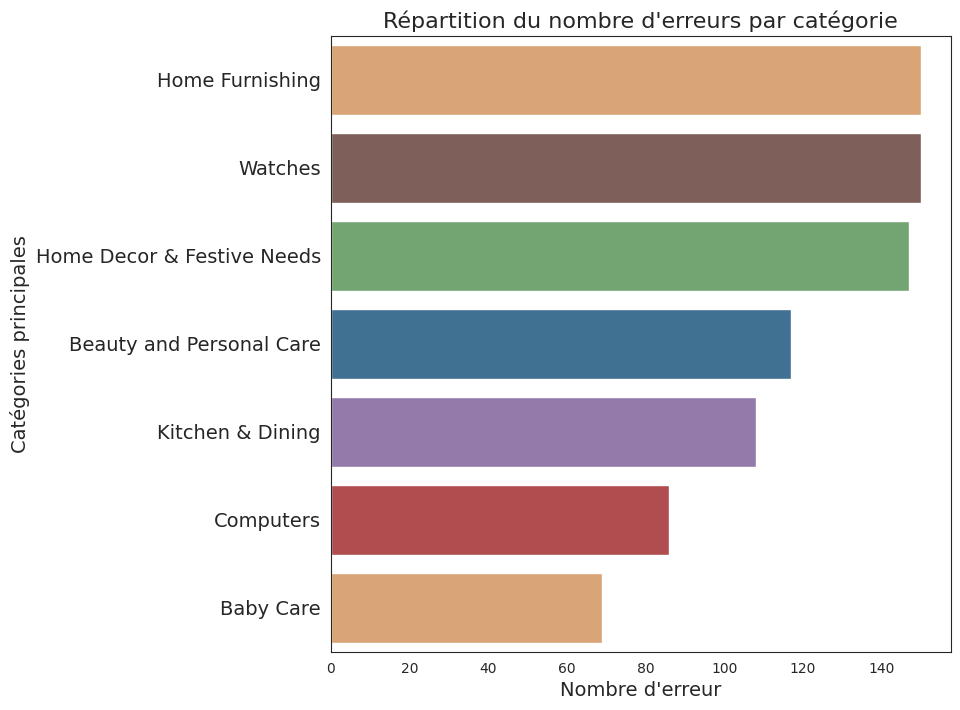

In [114]:
# Répartition des erreurs par catégorie
plt.figure(figsize=(8, 8))
sns.countplot(y='CATEGORIE', data=df_erreur_vgg16, orient='h',
              order=df_erreur_vgg16['CATEGORIE'].value_counts().index,
              palette=['#e9a467', '#845b53', '#6bad6b', '#3274a1',
                       '#9372b2', '#c03d3e'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=16)
plt.xlabel('Nombre d\'erreur', fontsize=14)
plt.ylabel('Catégories principales', fontsize=14)
plt.yticks(fontsize=14)
plt.show()

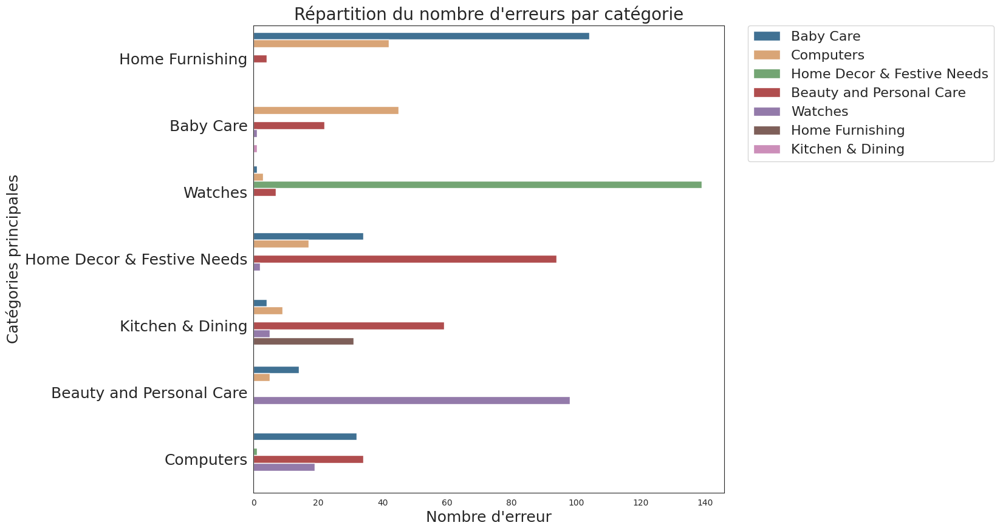

In [115]:
# Répartition des erreurs des catégories par catégorie
plt.figure(figsize=(10, 10))
sns.countplot(y='CATEGORIE', hue='Cluster_labels',
              data=df_erreur_vgg16, orient='h',
              palette=['#3274a1', '#e9a467', '#6bad6b', '#c03d3e',
                       '#9372b2', '#845b53', '#d684bd'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=20)
plt.xlabel('Nombre d\'erreur', fontsize=18)
plt.ylabel('Catégories principales', fontsize=18)
plt.yticks(fontsize=18)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=16)
plt.show()

In [116]:
df_visu_erreur_vgg16 = df_erreur_vgg16[['CATEGORIE', 'IMAGE_LOC',
                                        'Cluster_labels']].sample(10)
display(HTML(
    df_visu_erreur_vgg16.
    to_html(escape=False,
            formatters=dict(IMAGE_LOC=path_to_image_photo_html))))

,CATEGORIE,IMAGE_LOC,Cluster_labels
674,Home Furnishing,,Baby Care
581,Watches,,Home Decor & Festive Needs
566,Watches,,Home Decor & Festive Needs
119,Computers,,Baby Care
718,Home Furnishing,,Computers
103,Home Furnishing,,Computers
263,Home Decor & Festive Needs,,Computers
18,Watches,,Home Decor & Festive Needs
837,Computers,,Beauty and Personal Care
615,Baby Care,,Computers


### <span style=''>4.4 Xception</span>

- Xception créé par Google en 2017 signifie 'version extrême d'Inception' et constitue une modification de Inception.
- Avec une convolution séparable en profondeur modifiée, elle est même meilleure qu'Inception-v3 (également par Google, 1er prix à l'ILSVRC 2015) pour les jeux de données ImageNet ILSVRC et JFT.

In [117]:
# Utilisation de Xception pré-entraîné sur ImageNet avec les images
# d'origine
# Xception imports
from keras.applications.xception import preprocess_input
from keras.applications import Xception

# Liste
xcept_all_features = []

# Instanciation du modèle
model_xcept = Xception(weights='/kaggle/input/xception/xception_weights_tf_dim_ordering_tf_kernels_notop.h5', include_top=False)
# Résumé de l'architecture du modèle
model_xcept.summary()

for rep_image in data['image_loc']:

    # Charger l'image et la redimensionner à la taille
    # requise de 224×224 pixels.
    img = image.load_img(rep_image, target_size=(224, 224))
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler
    # avec dans Keras
    img = image.img_to_array(img)
    # Redimensionnement
    img = np.expand_dims(img, axis=0)
    # Préparer de nouvelles entrées pour le réseau.
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance
    # de l'image à chacun des 1000 types d'objets connus.
    xcept_feature = model_xcept.predict(img)
    # Ajouter la feature prédite en nparray à la liste
    xcept_all_features.append(np.array(xcept_feature).flatten())

xcept_all_features = np.array(xcept_all_features)

Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, None, None, 32)       864       ['input_2[0][0]']             
                                                                                                  
 block1_conv1_bn (BatchNorm  (None, None, None, 32)       128       ['block1_conv1[0][0]']        
 alization)                                                                                       
                                                                                                  
 block1_conv1_act (Activati  (None, None, None, 32)       0         ['block1_conv1_bn[0][0]

In [118]:
# Dataframe de sauvegarde des BOVW Xception
# Association des features à chaque image
data['xcept_bovw'] = [xcept_all_features[i] for i in range(data.shape[0])]
# Dataframe de travail
df_xcept_bovw = data[['image_proces', 'image_loc', 'Categorie_1', 'xcept_bovw']]
# Constituer le dataframe de vecteurs de BOVW Xception
df_xcept_vectors = pd.DataFrame.from_records(xcept_all_features)

In [119]:
# Sauvegarde du dataframe des vectors BOVW Xception
with open('/kaggle/working/df_xcept_vectors.pickle', 'wb') as f:
    pickle.dump(df_xcept_vectors, f, pickle.HIGHEST_PROTOCOL)

In [120]:
type_donnee = 'TSNE_XCEPTION'

In [121]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA
top_depart = time.time()
liste_param = [20, 30, 40, 50, 70, 80]
results_xcept = list()
tsne_results_xcept = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_xcept = \
        tsne.fit_transform(df_xcept_vectors)
    results_xcept.append(tsne_results_xcept)
print('t-SNE terminée! en : {} seconds'.format(time.time()-top_depart))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.191s...
[t-SNE] Computed neighbors for 1050 samples in 4.229s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 43.019642
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.317345
[t-SNE] KL divergence after 500 iterations: 1.163009
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.194s...
[t-SNE] Computed neighbors for 1050 samples in 4.548s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 45.881706
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.061287
[t-SNE] KL divergence after 500 iterations: 1.071812
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.196s...
[t-SNE] Computed neighbors for 1050 samples in 

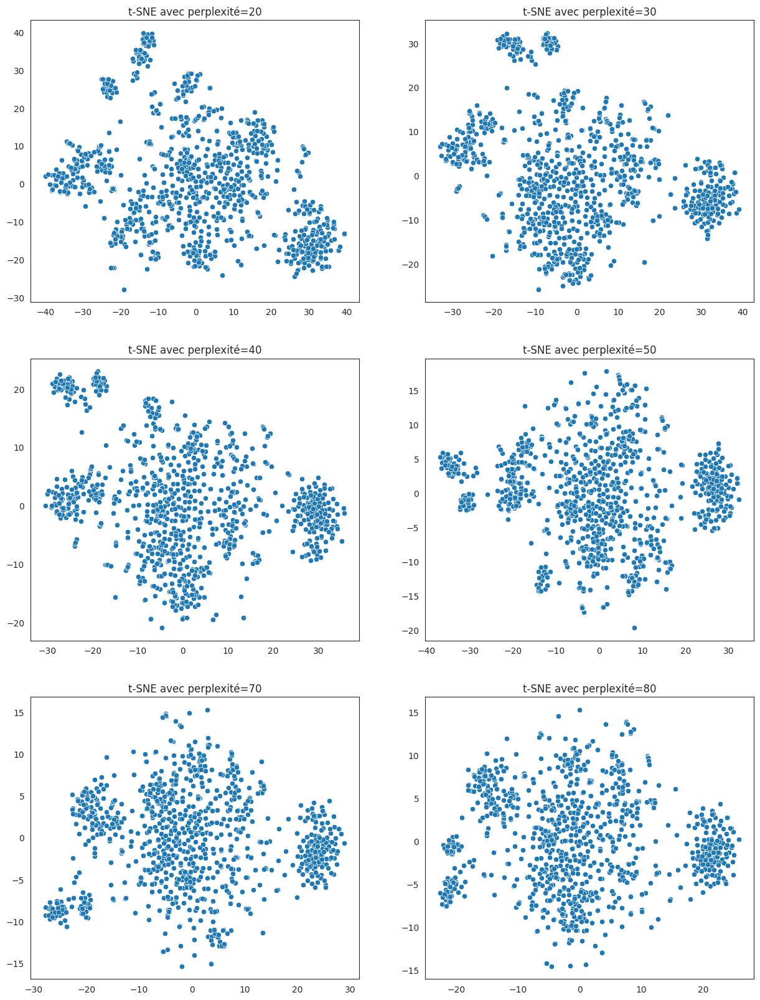

In [122]:
# Visualisation en 2D des différents résultats selon la perplexité
affiche_tsne(results_xcept, liste_param, 1)

In [123]:
# Réduction de dimension tsne
tsne_xcept = TSNE(verbose=1, perplexity=50, n_iter=5000)
X_proj_tsne_xcept = \
    tsne_xcept.fit_transform(df_xcept_vectors)
# Dataframe pour clustering
df_tsne_xcept = pd.DataFrame({'VAR1' : X_proj_tsne_xcept[:, 0],
                              'VAR2' : X_proj_tsne_xcept[:, 1],
                              'CATEGORIE' : df_xcept_bovw['Categorie_1'],
                              'IMAGE': df_xcept_bovw['image_proces'],
                              'IMAGE_LOC': df_xcept_bovw['image_loc']})

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.197s...
[t-SNE] Computed neighbors for 1050 samples in 4.416s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 49.320518
[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.665031
[t-SNE] KL divergence after 5000 iterations: 0.965359


In [124]:
# Sauvegarde du dataframe des TSNE Xception
with open('/kaggle/working/df_tsne_xcept.pickle', 'wb') as f:
    pickle.dump(df_tsne_xcept, f, pickle.HIGHEST_PROTOCOL)

In [125]:
cols = ['VAR1', 'VAR2']

In [126]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_clust = calcul_metrics_kmeans(df_tsne_xcept[cols],
                                     df_metrics_clust,
                                     type_donnee,
                                     seed, n_init, max_iter)
# Tri par indice de dispersion : proche de 0
df_metrics_clust[df_metrics_clust['Type_données'] == type_donnee] \
    .sort_values(by=['coef_silh', 'davies_bouldin', 'Durée (s)'],
                 ascending=[False, True, True]).style.hide()

Type_données,n_init,max_iter,coef_silh,dispersion,davies_bouldin,Durée (s)
TSNE_XCEPTION,10,100,0.495262,61413.210938,0.719226,0.041024
TSNE_XCEPTION,10,300,0.495262,61413.218750,0.719226,0.126901
TSNE_XCEPTION,10,400,0.495262,61413.210938,0.719226,0.131804
TSNE_XCEPTION,10,500,0.495262,61413.210938,0.719226,0.132195
TSNE_XCEPTION,10,200,0.495262,61413.210938,0.719226,0.139837
TSNE_XCEPTION,20,300,0.495262,61413.214844,0.719226,0.141513
TSNE_XCEPTION,20,100,0.495262,61413.210938,0.719226,0.144771
TSNE_XCEPTION,20,400,0.495262,61413.210938,0.719226,0.161301
TSNE_XCEPTION,20,500,0.495262,61413.218750,0.719226,0.161637
TSNE_XCEPTION,20,200,0.495262,61413.214844,0.719226,0.163838


In [127]:
# Instanciation du modèle KMeans avec les meilleurs paramètres
kmeans_tsne_xcept = KMeans(n_clusters=7, init='k-means++',
                           n_init=100, max_iter=500,
                           random_state=seed) \
    .fit(df_tsne_xcept[cols])
# Ajout de l'assignation du cluster au dataframe
df_tsne_xcept['Clusters'] = kmeans_tsne_xcept.labels_
kmeans_tsne_xcept_labels = kmeans_tsne_xcept.labels_

In [128]:
# Scores ?
df_scores = calcul_metriques_clusters(df_tsne_xcept,
                                                 df_scores,
                                                 type_donnee)
df_scores[df_scores['Type_données'] == type_donnee].style.hide()

Type_données,ARI,Homogénéité,Complétude,V-measure
TSNE_XCEPTION,0.438553,0.512370,0.521696,0.516991


In [129]:
# Sauvegarde des dataframes de trace
df_scores.to_csv('/kaggle/working/IMAGES_data_df_scores.csv')

Clusters,Nombre,%
0,179,17.050000
1,159,15.140000
2,83,7.900000
3,135,12.860000
4,139,13.240000
5,219,20.860000
6,136,12.950000


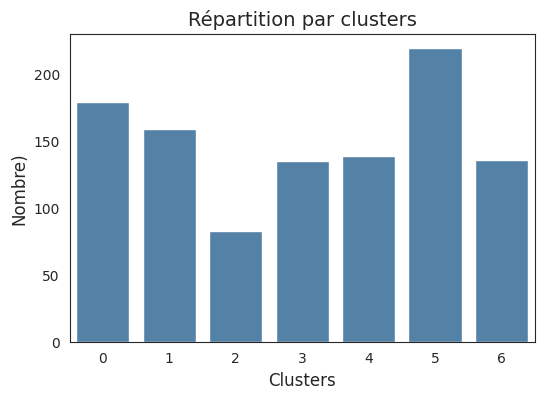

In [130]:
affiche_repartition_par_clusters(kmeans_tsne_xcept_labels)

In [131]:
# Les catégories par clusters
df_tsne_xcept.groupby('Clusters')['CATEGORIE'].value_counts(). \
    to_frame()

count
Clusters CATEGORIE                        
0        Home Furnishing                69
         Home Decor & Festive Needs     46
         Kitchen & Dining               34
         Baby Care                      16
         Computers                       9
         Beauty and Personal Care        5
1        Watches                       147
         Home Decor & Festive Needs      7
         Computers                       3
         Baby Care                       2
2        Kitchen & Dining               79
         Baby Care                       3
         Beauty and Personal Care        1
3        Computers                     100
         Beauty and Personal Care       13
         Home Decor & Festive Needs     11
         Home Furnishing                 4
         Kitchen & Dining                3
         Watches                         3
         Baby Care                       1
4        Beauty and Personal Care      117
         Kitchen & Dining               14
         Computers                       3
         Baby Care                       3
         Home Decor & Festive Needs      2
5        Baby Care                     114
         Home Furnishing                73
         Computers                      13
         Home Decor & Festive Needs     13
         Beauty and Personal Care        5
         Kitchen & Dining                1
6        Home Decor & Festive Needs     71
         Computers                      22
         Kitchen & Dining               19
         Baby Care                      11
         Beauty and Personal Care        9
         Home Furnishing                 4

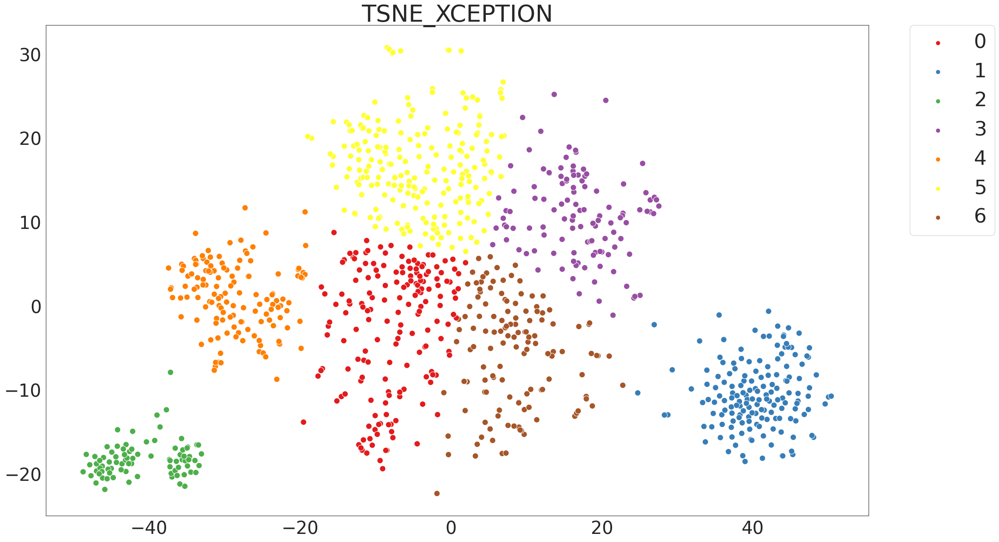

In [132]:
# Visualisation des clusters
affiche_projection_par_clusters(X_proj_tsne_xcept,
                                           kmeans_tsne_xcept_labels,
                                           type_donnee)

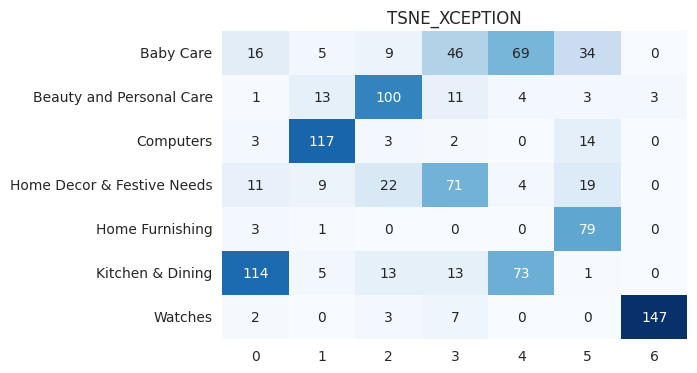

'Précision: 23.9%'

                            precision    recall  f1-score   support

                 Baby Care       0.11      0.09      0.10       179
  Beauty and Personal Care       0.09      0.10      0.09       135
                 Computers       0.02      0.02      0.02       139
Home Decor & Festive Needs       0.47      0.52      0.50       136
           Home Furnishing       0.00      0.00      0.00        83
          Kitchen & Dining       0.01      0.00      0.01       219
                   Watches       0.98      0.92      0.95       159

                  accuracy                           0.24      1050
                 macro avg       0.24      0.24      0.24      1050
              weighted avg       0.24      0.24      0.24      1050


In [133]:
dico_categories = {'0': 'Baby Care',
                   '1': 'Watches',
                   '2': 'Home Furnishing',
                   '3': 'Beauty and Personal Care',
                   '4': 'Computers',
                   '5': 'Kitchen & Dining',
                   '6': 'Home Decor & Festive Needs'}
affiche_qualite_categorisation(df_tsne_xcept,
                                          dico_categories, type_donnee)

In [134]:
# Nombre d'erreur
mask = df_tsne_xcept['CATEGORIE'] == df_tsne_xcept['Cluster_labels']
df_erreur_xcept = df_tsne_xcept[~mask]
display(f'Nombre d\'erreurs : {df_erreur_xcept.shape[0]}')

"Nombre d'erreurs : 799"

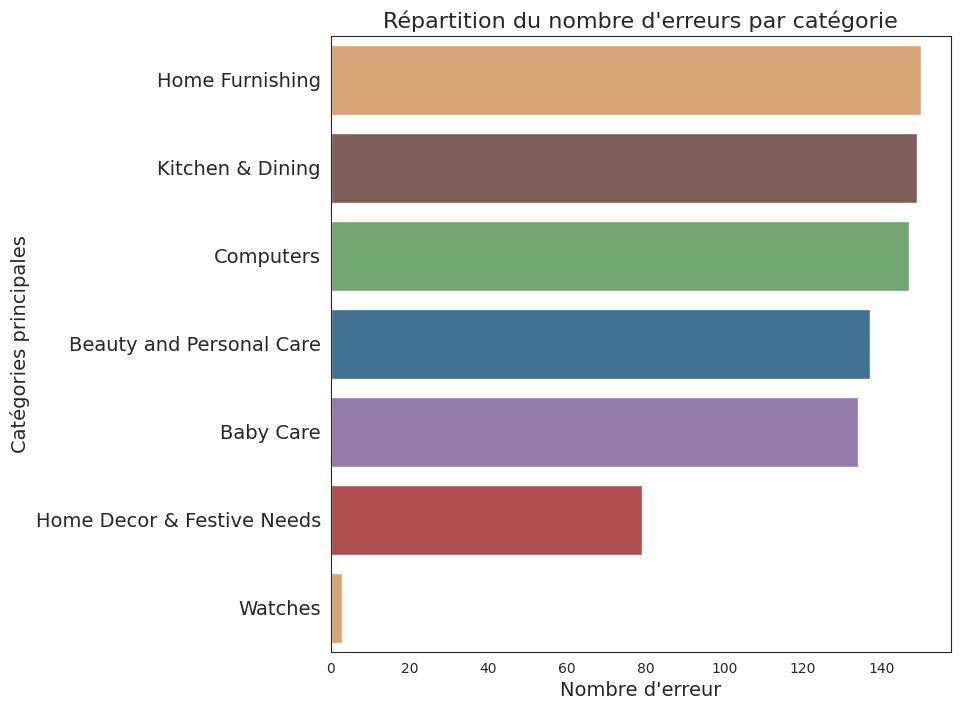

In [135]:
# Répartition des erreurs par catégorie
plt.figure(figsize=(8, 8))
sns.countplot(y='CATEGORIE', data=df_erreur_xcept, orient='h',
              order=df_erreur_xcept['CATEGORIE'].value_counts().index,
              palette=['#e9a467', '#845b53', '#6bad6b', '#3274a1',
                       '#9372b2', '#c03d3e'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=16)
plt.xlabel('Nombre d\'erreur', fontsize=14)
plt.ylabel('Catégories principales', fontsize=14)
plt.yticks(fontsize=14)
plt.show()

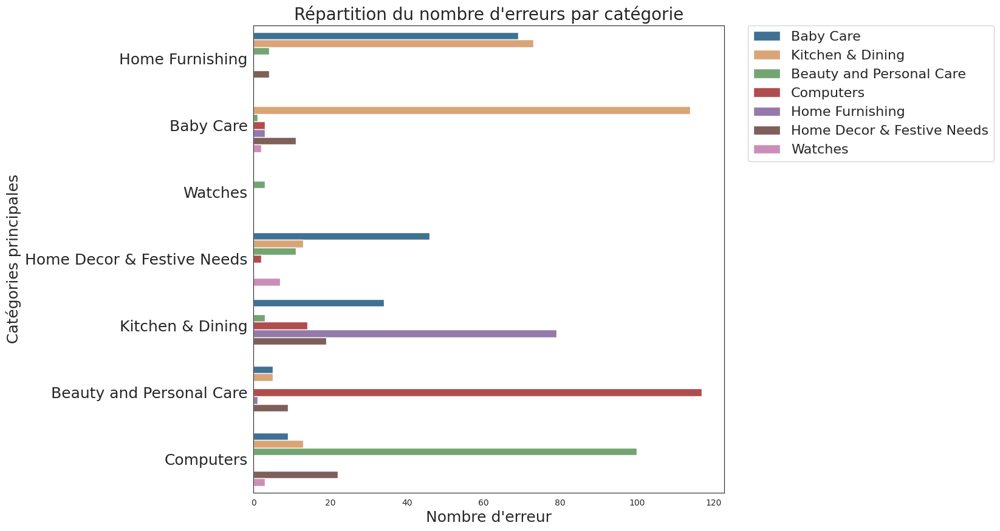

In [136]:
# Répartition des erreurs des catégories par catégorie
plt.figure(figsize=(10, 10))
sns.countplot(y='CATEGORIE', hue='Cluster_labels',
              data=df_erreur_xcept, orient='h',
              palette=['#3274a1', '#e9a467', '#6bad6b', '#c03d3e',
                       '#9372b2', '#845b53', '#d684bd'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=20)
plt.xlabel('Nombre d\'erreur', fontsize=18)
plt.ylabel('Catégories principales', fontsize=18)
plt.yticks(fontsize=18)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=16)
plt.show()

In [137]:
df_visu_erreur_xcept = df_erreur_xcept[['CATEGORIE', 'IMAGE_LOC',
                                        'Cluster_labels']].sample(10)
display(HTML(
    df_visu_erreur_xcept.
    to_html(escape=False,
            formatters=dict(IMAGE_LOC=path_to_image_photo_html))))

,CATEGORIE,IMAGE_LOC,Cluster_labels
636,Baby Care,,Kitchen & Dining
2,Baby Care,,Kitchen & Dining
939,Home Furnishing,,Kitchen & Dining
956,Kitchen & Dining,,Baby Care
40,Baby Care,,Kitchen & Dining
803,Computers,,Beauty and Personal Care
771,Baby Care,,Kitchen & Dining
606,Beauty and Personal Care,,Kitchen & Dining
257,Home Decor & Festive Needs,,Baby Care
1028,Computers,,Kitchen & Dining


In [138]:
dt = pd.read_csv("/kaggle/working/IMAGES_data_df_scores.csv")
dt.head()

,Unnamed: 0,Type_données,ARI,Homogénéité,Complétude,V-measure
0,0,TSNE_SIFT,0.03220,0.06075,0.06461,0.06262
1,1,TSNE_VGG16,0.29073,0.40521,0.44857,0.42579
2,2,TSNE_XCEPTION,0.43855,0.51237,0.52170,0.51699
